## Instructions:

## Todo:

### Inputs:

### Outputs:


<a name='index'></a>

## Notebook Index

1. <a href=#imports>Imports</a>


2. <a href=#read>Read Dataset</a>


3. <a href=#functions>Define data generator functions and default parameters</a>


4. <a href=#analyses>Analyses</a>

In [1]:
from IPython.display import HTML, Image, IFrame

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').show();
 } else {
 $('div.input').hide();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

---

<a name='imports'></a>
## Imports
Imports for function used in this notebook.

<a href=#index>index</a>

### Visualization

In [2]:
import plotly.io as pio
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode()
pio.renderers.keys()
pio.renderers.default = 'jupyterlab'

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Improve resolution of output graphcis
%config InlineBackend.figure_format ='retina'

### Data Wrangling

In [3]:
import pandas as pd
import numpy as np
import dask.dataframe as dd
from dask.distributed import Client
from pandas_profiling import ProfileReport

### ML

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score,f1_score,confusion_matrix, plot_confusion_matrix, classification_report
#import xgboost as xgb
import sklearn
import shap
shap.initjs()

### Clustering

In [5]:
from umap import UMAP
import hdbscan

### Utils

In [6]:
%load_ext autoreload
%autoreload 1

#autoreload utils module to reload everytime it's modified
%aimport utils

In [7]:
from pickle import dump, load
from tqdm.auto import tqdm
import glob

---

<a name='read'></a>
## Data Loading
All the data loaded from disk and used in this notebook

<a href=#index>index</a>

In [8]:
data_dict = {}
for file in sorted(glob.glob("../data/interim/*.csv")):
    file_name = file.split("/")[-1].split(".")[0]
    if file_name.startswith("NYC"):
        date_cols = [
    'Design_Start',
    'Final_Change_Date',
    'Schedule_Start',
    'Schedule_End',
]
    else:
        date_cols = []
    data_dict[file_name] = pd.read_csv(file, parse_dates=date_cols)
data_dict.keys()

dict_keys(['Capital_Projects_clean', 'Capital_Projects_pid', 'Capital_Projects_pid_melted', 'NYC_capital_projects_1yr', 'NYC_capital_projects_2yr', 'NYC_capital_projects_3yr', 'NYC_capital_projects_4yr', 'NYC_capital_projects_all'])

In [9]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    for name, df in data_dict.items():
        print(name)
        print("Shape:",df.shape)
        display(df.head())
        print("-------")

Capital_Projects_clean
Shape: (2095, 24)


,Record_ID,Date_Reported_As_Of,PID,Project_Name,Description,Category,Borough,Managing_Agency,Client_Agency,Current_Phase,Design_Start,Original_Budget,Budget_Forecast,Latest_Budget_Changes,Total_Budget_Changes,Original_Schedule,Forecast_Completion,Latest_Schedule_Changes,Total_Schedule_Changes,PID_Index,Change_Years,Change_Year,Current_Project_Years,Current_Project_Year
0,3-0,2014-05-01,3,26th Ward Waste Water Treatment Plant Prelimin...,The 26th Ward WWTP is mandated to be upgraded ...,Wastewater Treatment,Brooklyn,DEP,DEP,2-Design,2013-09-23,184896360.0,1.829810e+08,-1915400.0,-4318643.37,2020-01-13,2020-01-14,1.0,270.0,0,0.602340,1,5.93852,6
1,3-1,2015-02-01,3,26th Ward Waste Water Treatment Plant Prelimin...,The 26th Ward WWTP is mandated to be upgraded ...,Wastewater Treatment,Brooklyn,DEP,DEP,3-Construction Procurement,2013-09-23,184896360.0,1.687518e+08,-14229191.0,-4318643.37,2020-01-13,2020-07-19,187.0,270.0,1,1.358002,2,5.93852,6
2,3-2,2015-08-01,3,26th Ward Waste Water Treatment Plant Prelimin...,The 26th Ward WWTP is mandated to be upgraded ...,Wastewater Treatment,Brooklyn,DEP,DEP,3-Construction Procurement,2013-09-23,184896360.0,1.655324e+08,-3219322.0,-4318643.37,2020-01-13,2020-08-08,20.0,270.0,2,1.853563,2,5.93852,6
3,3-3,2016-01-01,3,26th Ward Waste Water Treatment Plant Prelimin...,The 26th Ward WWTP is mandated to be upgraded ...,Wastewater Treatment,Brooklyn,DEP,DEP,4-Construction,2013-09-23,184896360.0,1.692764e+08,3743944.0,-4318643.37,2020-01-13,2020-04-01,-129.0,270.0,3,2.272463,3,5.93852,6
4,3-4,2016-06-01,3,26th Ward Waste Water Treatment Plant Prelimin...,The 26th Ward WWTP is mandated to be upgraded ...,Wastewater Treatment,Brooklyn,DEP,DEP,4-Construction,2013-09-23,184896360.0,1.692764e+08,2.0,-4318643.37,2020-01-13,2020-04-13,12.0,270.0,4,2.688625,3,5.93852,6


-------
Capital_Projects_pid
Shape: (355, 23)


,PID,Project_Name,Category,Borough,Managing_Agency,Client_Agency,Number_Changes,Original_Budget,Design_Start,Original_Schedule,Forecast_Completion,Total_Schedule_Changes,Total_Budget_Changes,Original_Duration,Budget_Change_Ratio,Schedule_Change_Ratio,Budget_To_Date,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Mark_Metric,Budget_Ratios,Project_Years,Project_Year
0,3,26th Ward Waste Water Treatment Plant Prelimin...,Wastewater Treatment,Brooklyn,DEP,DEP,13,184896360.0,2013-09-23,2020-01-13,2020-10-09,270.0,-4318643.37,2303.0,-0.023357,0.117238,1.805777e+08,0.023916,0.023357,0.023916,0.976643,5.938520,6
1,7,Bowery Bay Waste Water Treatment Plant Main Se...,Wastewater Treatment,Queens,DEP,DEP,15,53493000.0,2013-05-01,2018-03-31,2020-02-14,685.0,15305457.00,1795.0,0.286121,0.381616,6.879846e+07,0.222468,0.286121,-0.222468,1.286121,6.335517,7
2,18,Croton Falls Pumping Station Construction,Water Supply,Carmel,DEP,DEP,15,66616435.0,2003-08-22,2017-05-31,2020-03-10,1014.0,1255175.02,5031.0,0.018842,0.201550,6.787161e+07,0.018493,0.018842,-0.018493,1.018842,16.027708,17
3,25,Gowanus Facilities Upgrade,Wastewater Treatment,Brooklyn,DEP,DEP,15,198134067.0,2001-11-01,2014-08-05,2019-12-31,1974.0,25233101.11,4660.0,0.127354,0.423605,2.233672e+08,0.112967,0.127354,-0.112967,1.127354,17.831988,18
4,34,Jamaica Waste Water Treatment Plant Upgrades,Wastewater Treatment,Queens,DEP,DEP,15,463790739.0,1996-05-01,2014-07-01,2019-12-31,2009.0,-14632471.11,6635.0,-0.031550,0.302788,4.491583e+08,0.032578,0.031550,0.032578,0.968450,23.335181,24


-------
Capital_Projects_pid_melted
Shape: (1420, 19)


,Schedule_Change_Ratio,Number_Changes,Total_Budget_Changes,Original_Duration,Budget_Change_Ratio,Design_Start,Project_Name,Category,Original_Budget,Forecast_Completion,Total_Schedule_Changes,Client_Agency,Borough,Budget_To_Date,Managing_Agency,Original_Schedule,PID,metric,metric_value
0,0.117238,13,-4318643.37,2303.0,-0.023357,2013-09-23,26th Ward Waste Water Treatment Plant Prelimin...,Wastewater Treatment,184896360.0,2020-10-09,270.0,DEP,Brooklyn,1.805777e+08,DEP,2020-01-13,3,Budget_Abs_Per_Error,0.023916
1,0.381616,15,15305457.00,1795.0,0.286121,2013-05-01,Bowery Bay Waste Water Treatment Plant Main Se...,Wastewater Treatment,53493000.0,2020-02-14,685.0,DEP,Queens,6.879846e+07,DEP,2018-03-31,7,Budget_Abs_Per_Error,0.222468
2,0.201550,15,1255175.02,5031.0,0.018842,2003-08-22,Croton Falls Pumping Station Construction,Water Supply,66616435.0,2020-03-10,1014.0,DEP,Carmel,6.787161e+07,DEP,2017-05-31,18,Budget_Abs_Per_Error,0.018493
3,0.423605,15,25233101.11,4660.0,0.127354,2001-11-01,Gowanus Facilities Upgrade,Wastewater Treatment,198134067.0,2019-12-31,1974.0,DEP,Brooklyn,2.233672e+08,DEP,2014-08-05,25,Budget_Abs_Per_Error,0.112967
4,0.302788,15,-14632471.11,6635.0,-0.031550,1996-05-01,Jamaica Waste Water Treatment Plant Upgrades,Wastewater Treatment,463790739.0,2019-12-31,2009.0,DEP,Queens,4.491583e+08,DEP,2014-07-01,34,Budget_Abs_Per_Error,0.032578


-------
NYC_capital_projects_1yr
Shape: (175, 31)


,PID,Project_Name,Description,Category,Borough,Managing_Agency,Client_Agency,Phase_Start,Current_Project_Years,Current_Project_Year,Design_Start,Budget_Start,Schedule_Start,Final_Change_Date,Final_Change_Years,Phase_End,Budget_End,Schedule_End,Number_Changes,Duration_Start,Duration_End,Schedule_Change,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv
0,3,26th Ward Waste Water Treatment Plant Prelimin...,The 26th Ward WWTP is mandated to be upgraded ...,Wastewater Treatment,Brooklyn,DEP,DEP,2-Design,5.938520,6,2013-09-23,184896360.0,2020-01-13,2014-05-01,0.602340,2-Design,1.829810e+08,2020-01-14,0,2303,2304,1,-1915400.00,0.000434,-0.010359,0.010468,0.010359,1.000434,0.989641,-0.000434,0.010468
1,7,Bowery Bay Waste Water Treatment Plant Main Se...,The existing Main Sewage Pumps have deteriorat...,Wastewater Treatment,Queens,DEP,DEP,2-Design,6.335517,7,2013-05-01,53493000.0,2018-03-31,2014-05-01,0.999336,2-Design,5.372672e+07,2018-03-31,2,1795,1795,0,233722.00,0.000000,0.004369,0.004350,0.004369,1.000000,1.004369,0.000000,-0.004350
2,94,New Ferry Boat Construction,Replace the two Barberi class boats and the Jo...,Ferries,not_specified,DOT,not_specified,2-Design,4.961087,5,2014-09-15,260623370.0,2021-06-30,2015-08-01,0.876130,2-Design,3.275520e+08,2020-02-11,1,2480,1975,-505,66928630.00,-0.203629,0.256802,0.204330,0.256802,0.796371,1.256802,0.255696,-0.204330
3,113,Riverside Drive/West 158th Street Bridge Rehab...,Deck replacement of the Riverside Drive Viaduc...,"Bridges, Streets and Roadways",Manhattan,DOT,not_specified,2-Design,4.859785,5,2014-10-22,54706000.0,2019-06-30,2015-08-01,0.774828,2-Design,6.405742e+07,2021-12-17,1,1712,2613,901,9351424.18,0.526285,0.170940,0.145985,0.170940,1.526285,1.170940,-0.344814,-0.145985
4,131,49th Avenue Bridge Replacement,Replace the 49th Avenue bridge over Long Islan...,"Bridges, Streets and Roadways",Queens,DOT,not_specified,2-Design,2.045217,3,2017-08-15,81252000.0,2024-10-28,2018-08-01,0.961005,2-Design,8.159500e+07,2024-06-13,2,2631,2494,-137,343000.00,-0.052071,0.004221,0.004204,0.004221,0.947929,1.004221,0.054932,-0.004204


-------
NYC_capital_projects_2yr
Shape: (189, 31)


,PID,Project_Name,Description,Category,Borough,Managing_Agency,Client_Agency,Phase_Start,Current_Project_Years,Current_Project_Year,Design_Start,Budget_Start,Schedule_Start,Final_Change_Date,Final_Change_Years,Phase_End,Budget_End,Schedule_End,Number_Changes,Duration_Start,Duration_End,Schedule_Change,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv
0,3,26th Ward Waste Water Treatment Plant Prelimin...,The 26th Ward WWTP is mandated to be upgraded ...,Wastewater Treatment,Brooklyn,DEP,DEP,2-Design,5.938520,6,2013-09-23,184896360.0,2020-01-13,2015-08-01,1.853563,3-Construction Procurement,1.655324e+08,2020-08-08,2,2303,2511,208,-19363913.00,0.090317,-0.104728,0.116980,0.104728,1.090317,0.895272,-0.082836,0.116980
1,7,Bowery Bay Waste Water Treatment Plant Main Se...,The existing Main Sewage Pumps have deteriorat...,Wastewater Treatment,Queens,DEP,DEP,2-Design,6.335517,7,2013-05-01,53493000.0,2018-03-31,2015-02-01,1.754998,3-Construction Procurement,5.266840e+07,2018-04-01,3,1795,1796,1,-824597.00,0.000557,-0.015415,0.015656,0.015415,1.000557,0.984585,-0.000557,0.015656
2,91,Mill Basin Bridge Replacement,Complete replacement of bascule bridge with a ...,Bridges,Brooklyn,DOT,not_specified,2-Design,7.436155,8,2012-03-25,374745267.0,2020-01-23,2014-01-01,1.771426,2-Design,3.646377e+08,2020-09-15,1,2860,3096,236,-10107580.00,0.082517,-0.026972,0.027720,0.026972,1.082517,0.973028,-0.076227,0.027720
3,94,New Ferry Boat Construction,Replace the two Barberi class boats and the Jo...,Ferries,not_specified,DOT,not_specified,2-Design,4.961087,5,2014-09-15,260623370.0,2021-06-30,2016-06-01,1.711192,3-Construction Procurement,3.474083e+08,2020-03-16,3,2480,2009,-471,86784902.61,-0.189919,0.332990,0.249807,0.332990,0.810081,1.332990,0.234445,-0.249807
4,97,Bruckner Expressway Westchester Creek Bridge R...,Replace existing bridge with a wider double-le...,"Bridges, Streets and Roadways",Bronx,DOT,not_specified,2-Design,7.107607,8,2012-07-23,151775497.0,2019-11-20,2014-05-01,1.771426,2-Design,1.952172e+08,2020-07-21,2,2676,2920,244,43441727.00,0.091181,0.286224,0.222530,0.286224,1.091181,1.286224,-0.083562,-0.222530


-------
NYC_capital_projects_3yr
Shape: (149, 31)


,PID,Project_Name,Description,Category,Borough,Managing_Agency,Client_Agency,Phase_Start,Current_Project_Years,Current_Project_Year,Design_Start,Budget_Start,Schedule_Start,Final_Change_Date,Final_Change_Years,Phase_End,Budget_End,Schedule_End,Number_Changes,Duration_Start,Duration_End,Schedule_Change,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv
0,3,26th Ward Waste Water Treatment Plant Prelimin...,The 26th Ward WWTP is mandated to be upgraded ...,Wastewater Treatment,Brooklyn,DEP,DEP,2-Design,5.938520,6,2013-09-23,184896360.0,2020-01-13,2016-06-01,2.688625,4-Construction,1.692764e+08,2020-04-13,4,2303,2394,91,-15619967.29,0.039514,-0.084480,0.092275,0.084480,1.039514,0.915520,-0.038012,0.092275
1,7,Bowery Bay Waste Water Treatment Plant Main Se...,The existing Main Sewage Pumps have deteriorat...,Wastewater Treatment,Queens,DEP,DEP,2-Design,6.335517,7,2013-05-01,53493000.0,2018-03-31,2016-01-01,2.669459,4-Construction,6.311179e+07,2019-02-28,5,1795,2129,334,9618785.30,0.186072,0.179814,0.152409,0.179814,1.186072,1.179814,-0.156881,-0.152409
2,91,Mill Basin Bridge Replacement,Complete replacement of bascule bridge with a ...,Bridges,Brooklyn,DOT,not_specified,2-Design,7.436155,8,2012-03-25,374745267.0,2020-01-23,2015-02-01,2.855637,3-Construction Procurement,3.400726e+08,2020-09-26,3,2860,3107,247,-34672662.00,0.086364,-0.092523,0.101957,0.092523,1.086364,0.907477,-0.079498,0.101957
3,94,New Ferry Boat Construction,Replace the two Barberi class boats and the Jo...,Ferries,not_specified,DOT,not_specified,2-Design,4.961087,5,2014-09-15,260623370.0,2021-06-30,2017-09-01,2.962415,4-Construction,3.483743e+08,2021-02-28,6,2480,2358,-122,87750902.00,-0.049194,0.336696,0.251887,0.336696,0.950806,1.336696,0.051739,-0.251887
4,97,Bruckner Expressway Westchester Creek Bridge R...,Replace existing bridge with a wider double-le...,"Bridges, Streets and Roadways",Bronx,DOT,not_specified,2-Design,7.107607,8,2012-07-23,151775497.0,2019-11-20,2015-02-01,2.527088,2-Design,1.985700e+08,2020-10-14,3,2676,3005,329,46794464.00,0.122945,0.308314,0.235657,0.308314,1.122945,1.308314,-0.109484,-0.235657


-------
NYC_capital_projects_4yr
Shape: (124, 31)


,PID,Project_Name,Description,Category,Borough,Managing_Agency,Client_Agency,Phase_Start,Current_Project_Years,Current_Project_Year,Design_Start,Budget_Start,Schedule_Start,Final_Change_Date,Final_Change_Years,Phase_End,Budget_End,Schedule_End,Number_Changes,Duration_Start,Duration_End,Schedule_Change,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv
0,3,26th Ward Waste Water Treatment Plant Prelimin...,The 26th Ward WWTP is mandated to be upgraded ...,Wastewater Treatment,Brooklyn,DEP,DEP,2-Design,5.938520,6,2013-09-23,184896360.0,2020-01-13,2017-09-01,3.939848,4-Construction,1.751284e+08,2020-04-28,7,2303,2409,106,-9.767950e+06,0.046027,-0.052829,0.055776,0.052829,1.046027,0.947171,-0.044002,0.055776
1,7,Bowery Bay Waste Water Treatment Plant Main Se...,The existing Main Sewage Pumps have deteriorat...,Wastewater Treatment,Queens,DEP,DEP,2-Design,6.335517,7,2013-05-01,53493000.0,2018-03-31,2017-04-01,3.917945,4-Construction,6.343881e+07,2017-11-10,8,1795,1654,-141,9.945806e+06,-0.078552,0.185927,0.156778,0.185927,0.921448,1.185927,0.085248,-0.156778
2,91,Mill Basin Bridge Replacement,Complete replacement of bascule bridge with a ...,Bridges,Brooklyn,DOT,not_specified,2-Design,7.436155,8,2012-03-25,374745267.0,2020-01-23,2016-01-01,3.770098,4-Construction,3.841156e+08,2021-01-24,5,2860,3227,367,9.370341e+06,0.128322,0.025005,0.024395,0.025005,1.128322,1.025005,-0.113728,-0.024395
3,94,New Ferry Boat Construction,Replace the two Barberi class boats and the Jo...,Ferries,not_specified,DOT,not_specified,2-Design,4.961087,5,2014-09-15,260623370.0,2021-06-30,2018-08-01,3.876876,4-Construction,2.850100e+08,2021-02-08,8,2480,2338,-142,2.438663e+07,-0.057258,0.093570,0.085564,0.093570,0.942742,1.093570,0.060736,-0.085564
4,97,Bruckner Expressway Westchester Creek Bridge R...,Replace existing bridge with a wider double-le...,"Bridges, Streets and Roadways",Bronx,DOT,not_specified,2-Design,7.107607,8,2012-07-23,151775497.0,2019-11-20,2016-06-01,3.857711,2-Design,2.682995e+08,2021-03-04,6,2676,3146,470,1.165240e+08,0.175635,0.767739,0.434306,0.767739,1.175635,1.767739,-0.149396,-0.434306


-------
NYC_capital_projects_all
Shape: (355, 31)


,PID,Project_Name,Description,Category,Borough,Managing_Agency,Client_Agency,Phase_Start,Current_Project_Years,Current_Project_Year,Design_Start,Budget_Start,Schedule_Start,Final_Change_Date,Final_Change_Years,Phase_End,Budget_End,Schedule_End,Number_Changes,Duration_Start,Duration_End,Schedule_Change,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv
0,3,26th Ward Waste Water Treatment Plant Prelimin...,The 26th Ward WWTP is mandated to be upgraded ...,Wastewater Treatment,Brooklyn,DEP,DEP,2-Design,5.938520,6,2013-09-23,184896360.0,2020-01-13,2019-09-01,5.938520,4-Construction,1.805777e+08,2020-10-09,12,2303,2573,270,-4318643.37,0.117238,-0.023357,0.023916,0.023357,1.117238,0.976643,-0.104936,0.023916
1,7,Bowery Bay Waste Water Treatment Plant Main Se...,The existing Main Sewage Pumps have deteriorat...,Wastewater Treatment,Queens,DEP,DEP,2-Design,6.335517,7,2013-05-01,53493000.0,2018-03-31,2019-09-01,6.335517,4-Construction,6.879846e+07,2020-02-14,14,1795,2480,685,15305457.00,0.381616,0.286121,0.222468,0.286121,1.381616,1.286121,-0.276210,-0.222468
2,18,Croton Falls Pumping Station Construction,This project will construct a new pumping stat...,Water Supply,Carmel,DEP,DEP,4-Construction,16.027708,17,2003-08-22,66616435.0,2017-05-31,2019-09-01,16.027708,4-Construction,6.787161e+07,2020-03-10,14,5031,6045,1014,1255175.02,0.201550,0.018842,0.018493,0.018842,1.201550,1.018842,-0.167742,-0.018493
3,25,Gowanus Facilities Upgrade,This project will rehabilite the existing Flus...,Wastewater Treatment,Brooklyn,DEP,DEP,4-Construction,17.831988,18,2001-11-01,198134067.0,2014-08-05,2019-09-01,17.831988,4-Construction,2.233672e+08,2019-12-31,14,4660,6634,1974,25233101.11,0.423605,0.127354,0.112967,0.127354,1.423605,1.127354,-0.297558,-0.112967
4,34,Jamaica Waste Water Treatment Plant Upgrades,This project will replace the Jamaica Waste Wa...,Wastewater Treatment,Queens,DEP,DEP,4-Construction,23.335181,24,1996-05-01,463790739.0,2014-07-01,2019-09-01,23.335181,4-Construction,4.491583e+08,2019-12-31,14,6635,8644,2009,-14632471.11,0.302788,-0.031550,0.032578,0.031550,1.302788,0.968450,-0.232416,0.032578


-------


---

In [10]:
df = data_dict["NYC_capital_projects_3yr"]
df.head()

,PID,Project_Name,Description,Category,Borough,Managing_Agency,Client_Agency,Phase_Start,Current_Project_Years,Current_Project_Year,...,Schedule_Change,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv
0,3,26th Ward Waste Water Treatment Plant Prelimin...,The 26th Ward WWTP is mandated to be upgraded ...,Wastewater Treatment,Brooklyn,DEP,DEP,2-Design,5.938520,6,...,91,-15619967.29,0.039514,-0.084480,0.092275,0.084480,1.039514,0.915520,-0.038012,0.092275
1,7,Bowery Bay Waste Water Treatment Plant Main Se...,The existing Main Sewage Pumps have deteriorat...,Wastewater Treatment,Queens,DEP,DEP,2-Design,6.335517,7,...,334,9618785.30,0.186072,0.179814,0.152409,0.179814,1.186072,1.179814,-0.156881,-0.152409
2,91,Mill Basin Bridge Replacement,Complete replacement of bascule bridge with a ...,Bridges,Brooklyn,DOT,not_specified,2-Design,7.436155,8,...,247,-34672662.00,0.086364,-0.092523,0.101957,0.092523,1.086364,0.907477,-0.079498,0.101957
3,94,New Ferry Boat Construction,Replace the two Barberi class boats and the Jo...,Ferries,not_specified,DOT,not_specified,2-Design,4.961087,5,...,-122,87750902.00,-0.049194,0.336696,0.251887,0.336696,0.950806,1.336696,0.051739,-0.251887
4,97,Bruckner Expressway Westchester Creek Bridge R...,Replace existing bridge with a wider double-le...,"Bridges, Streets and Roadways",Bronx,DOT,not_specified,2-Design,7.107607,8,...,329,46794464.00,0.122945,0.308314,0.235657,0.308314,1.122945,1.308314,-0.109484,-0.235657


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149 entries, 0 to 148
Data columns (total 31 columns):
PID                      149 non-null int64
Project_Name             149 non-null object
Description              149 non-null object
Category                 149 non-null object
Borough                  149 non-null object
Managing_Agency          149 non-null object
Client_Agency            149 non-null object
Phase_Start              149 non-null object
Current_Project_Years    149 non-null float64
Current_Project_Year     149 non-null int64
Design_Start             149 non-null datetime64[ns]
Budget_Start             149 non-null float64
Schedule_Start           149 non-null datetime64[ns]
Final_Change_Date        149 non-null datetime64[ns]
Final_Change_Years       149 non-null float64
Phase_End                149 non-null object
Budget_End               149 non-null float64
Schedule_End             149 non-null datetime64[ns]
Number_Changes           149 non-null int64
Duratio

In [12]:
df_to_transform = df.select_dtypes(["int64", "float64"]).drop(columns=["PID"])
transformer = sklearn.preprocessing.RobustScaler().fit(df_to_transform)
transformed_columns = pd.DataFrame(transformer.transform(df_to_transform), columns = df_to_transform.columns)
scaled_df = (df[df.columns.difference(transformed_columns.columns)]).join(transformed_columns)

In [13]:
df.describe()

,PID,Current_Project_Years,Current_Project_Year,Budget_Start,Final_Change_Years,Budget_End,Number_Changes,Duration_Start,Duration_End,Schedule_Change,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv
count,149.000000,149.000000,149.000000,1.490000e+02,149.000000,1.490000e+02,149.000000,149.000000,149.000000,149.000000,1.490000e+02,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000
mean,555.583893,3.953666,4.530201,1.008103e+08,2.625763,1.205085e+08,3.651007,1943.932886,2281.234899,337.302013,1.969824e+07,0.219925,1.025425,0.278423,1.117067,1.219925,2.025425,-0.136850,-0.029318
std,211.515385,1.604550,1.579245,2.038613e+08,0.310413,2.487653e+08,1.892111,643.086715,687.712968,430.757797,9.737516e+07,0.321632,6.266038,0.726055,6.250245,0.321632,6.266038,0.171868,0.777389
min,3.000000,2.045217,3.000000,8.130000e+05,1.708454,1.024036e+07,0.000000,663.000000,1103.000000,-397.000000,-2.768796e+08,-0.171521,-0.884622,0.000000,0.000000,0.828479,0.115378,-0.587431,-0.983496
25%,449.000000,2.653032,3.000000,3.270900e+07,2.527088,3.750000e+07,3.000000,1495.000000,1825.000000,0.000000,0.000000e+00,0.000000,0.000000,0.020100,0.020512,1.000000,1.000000,-0.225463,-0.227392
50%,555.000000,3.455239,4.000000,5.065300e+07,2.716004,5.647071e+07,4.000000,1886.000000,2172.000000,242.000000,1.675000e+06,0.111449,0.027758,0.111348,0.122937,1.111449,1.027758,-0.100274,-0.027008
75%,689.000000,4.788599,5.000000,7.717600e+07,2.844685,9.544978e+07,5.000000,2248.000000,2628.000000,558.000000,1.964802e+07,0.291094,0.294318,0.318693,0.336696,1.291094,1.294318,0.000000,0.000000
max,1004.000000,8.561435,9.000000,1.910339e+09,2.998008,1.984467e+09,7.000000,4360.000000,5107.000000,2209.000000,8.078026e+08,1.423834,59.592113,7.667156,59.592113,2.423834,60.592113,0.207031,7.667156


In [14]:
scaled_df.describe()

,PID,Current_Project_Years,Current_Project_Year,Budget_Start,Final_Change_Years,Budget_End,Number_Changes,Duration_Start,Duration_End,Schedule_Change,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000
mean,555.583893,0.233394,0.265101,1.127967,-0.284136,1.105057,-0.174497,0.076936,0.136033,0.170792,0.917305,0.372647,3.389761,0.559538,3.144153,0.372647,3.389761,-0.162226,-0.010158
std,211.515385,0.751346,0.789622,4.584553,0.977378,4.292773,0.946055,0.854033,0.856430,0.771967,4.955977,1.104908,21.290032,2.431586,19.767753,1.104908,21.290032,0.762291,3.418713
min,3.000000,-0.660256,-0.500000,-1.120831,-3.172414,-0.797766,-2.000000,-1.624170,-1.331258,-1.145161,-14.177231,-0.972094,-3.099979,-0.372909,-0.388813,-0.972094,-3.099979,-2.160694,-4.206335
25%,449.000000,-0.375641,-0.500000,-0.403535,-0.594828,-0.327365,-0.500000,-0.519256,-0.432130,-0.433692,-0.085250,-0.382864,-0.094312,-0.305593,-0.323939,-0.382864,-0.094312,-0.555253,-0.881228
50%,555.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,689.000000,0.624359,0.500000,0.596465,0.405172,0.672635,0.500000,0.480744,0.567870,0.566308,0.914750,0.617136,0.905688,0.694407,0.676061,0.617136,0.905688,0.444747,0.118772
max,1004.000000,2.391026,2.500000,41.821713,0.887931,33.270127,1.500000,3.285525,3.655044,3.525090,41.028433,4.508459,202.380997,25.304678,188.084140,4.508459,202.380997,1.362996,33.836521


In [15]:
profile = ProfileReport(scaled_df)

In [16]:
profile.to_file("report_after_robust_scaling.html")

In [17]:
del profile

<a name='analyses'></a>
## Analyses

<a href=#index>index</a>

#### TL,DR

*NOTE: In the TL,DR, optimize for **clarity** and **comprehensiveness**. The goal is to convey the post with the least amount of friction, especially since ipython/beakers require much more scrolling than blog posts. Make the reader get a correct understanding of the post's takeaway, and the points supporting that takeaway without having to strain through paragraphs and tons of prose. Bullet points are great here, but are up to you. Try to avoid academic paper style abstracts.*

 - Having a specific title will help avoid having someone browse posts and only finding vague, similar sounding titles
 - Having an itemized, short, and clear tl,dr will help readers understand your content
 - Setting the reader's context with a motivation section makes someone understand how to judge your choices
 - Visualizations that can stand alone, via legends, labels, and captions are more understandable and powerful


---

### Dimensionality Reduction

#### Motivation

*NOTE: optimize in this section for **context setting**, as specifically as you can. For instance, this post is generally a set of standards for work in the repo. The specific motivation is to have least friction to current workflow while being able to painlessly aggregate it later.*

The knowledge repo was created to consolidate research work that is currently scattered in emails, blogposts, and presentations, so that people didn't redo their work.

### This Section Says Exactly This Takeaway

In [18]:
identifier_columns = ["PID",  "Project_Name", "Description"]

In [19]:
dummified = pd.get_dummies(scaled_df.drop(columns=identifier_columns))
dummified[identifier_columns] = scaled_df[identifier_columns]
dummified= dummified[identifier_columns + list(dummified.columns.difference(identifier_columns))]
dummified.head()

,PID,Project_Name,Description,Borough_Bronx,Borough_Brooklyn,"Borough_Brooklyn, Queens",Borough_Citywide,Borough_Manhattan,"Borough_Manhattan, Bronx","Borough_Manhattan, Staten Island, Bronx",...,Phase_End_2-Design,Phase_End_3-Construction Procurement,Phase_End_4-Construction,Phase_Start_2-Design,Phase_Start_3-Construction Procurement,Phase_Start_4-Construction,Schedule_Change,Schedule_Change_Ratio,Schedule_End,Schedule_Start
0,3,26th Ward Waste Water Treatment Plant Prelimin...,The 26th Ward WWTP is mandated to be upgraded ...,0,1,0,0,0,0,0,...,0,0,1,1,0,0,-0.270609,-0.247122,2020-04-13,2020-01-13
1,7,Bowery Bay Waste Water Treatment Plant Main Se...,The existing Main Sewage Pumps have deteriorat...,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0.164875,0.256354,2019-02-28,2018-03-31
2,91,Mill Basin Bridge Replacement,Complete replacement of bascule bridge with a ...,0,1,0,0,0,0,0,...,0,1,0,1,0,0,0.008961,-0.086178,2020-09-26,2020-01-23
3,94,New Ferry Boat Construction,Replace the two Barberi class boats and the Jo...,0,0,0,0,0,0,0,...,0,0,1,1,0,0,-0.652330,-0.551860,2021-02-28,2021-06-30
4,97,Bruckner Expressway Westchester Creek Bridge R...,Replace existing bridge with a wider double-le...,1,0,0,0,0,0,0,...,1,0,0,1,0,0,0.155914,0.039490,2020-10-14,2019-11-20


In [20]:
dummified.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149 entries, 0 to 148
Data columns (total 89 columns):
PID                                            149 non-null int64
Project_Name                                   149 non-null object
Description                                    149 non-null object
Borough_Bronx                                  149 non-null uint8
Borough_Brooklyn                               149 non-null uint8
Borough_Brooklyn, Queens                       149 non-null uint8
Borough_Citywide                               149 non-null uint8
Borough_Manhattan                              149 non-null uint8
Borough_Manhattan, Bronx                       149 non-null uint8
Borough_Manhattan, Staten Island, Bronx        149 non-null uint8
Borough_Marlboro                               149 non-null uint8
Borough_New York                               149 non-null uint8
Borough_Olive                                  149 non-null uint8
Borough_Port Jervis                

In [21]:
budget_cols = ['Budget_Abs_Per_Error',
 'Budget_Change',
 'Budget_Change_Ratio',
 'Budget_End',
 'Budget_End_Ratio',
 'Budget_Ratio_Inv',
 'Budget_Rel_Per_Error',
 #'Budget_Start',
]

schedule_cols = ['Schedule_Change',
                 'Schedule_Change_Ratio',
                 'Duration_End', 
                 'Duration_End_Ratio',
                 'Duration_Ratio_Inv',
                 'Final_Change_Years'
                 #'Schedule_End', #not int or float
                 #'Schedule_Start' #not int or float
                ]

In [22]:
dummified["PID"] = dummified["PID"].astype("category")

In [23]:
umap_df = dummified.select_dtypes([int, float, "uint8"]).drop(columns = budget_cols + schedule_cols)
umap_df.columns

Index(['Borough_Bronx', 'Borough_Brooklyn', 'Borough_Brooklyn, Queens',
       'Borough_Citywide', 'Borough_Manhattan', 'Borough_Manhattan, Bronx',
       'Borough_Manhattan, Staten Island, Bronx', 'Borough_Marlboro',
       'Borough_New York', 'Borough_Olive', 'Borough_Port Jervis',
       'Borough_Queens', 'Borough_Staten Island', 'Borough_Valhalla',
       'Borough_not_specified', 'Budget_Start', 'Category_Arts and Culture',
       'Category_Bridges', 'Category_Bridges, Streets and Roadways',
       'Category_Ferries', 'Category_Health and Hospitals',
       'Category_Industrial Development',
       'Category_Industrial Development, Parks',
       'Category_Other Government Facilities', 'Category_Parks',
       'Category_Parks, Streets and Roadways',
       'Category_Public Safety and Criminal Justice', 'Category_Sanitation',
       'Category_Schools', 'Category_Sewers', 'Category_Streets and Roadways',
       'Category_Wastewater Treatment', 'Category_Water Supply',
       'Client_

In [24]:
dummified['Budget_Change']

0     -0.880240
1      0.404305
2     -1.849940
3      4.380894
4      2.296387
         ...   
144   -0.085250
145   -0.085250
146   -0.085250
147   -0.085250
148   -0.085250
Name: Budget_Change, Length: 149, dtype: float64

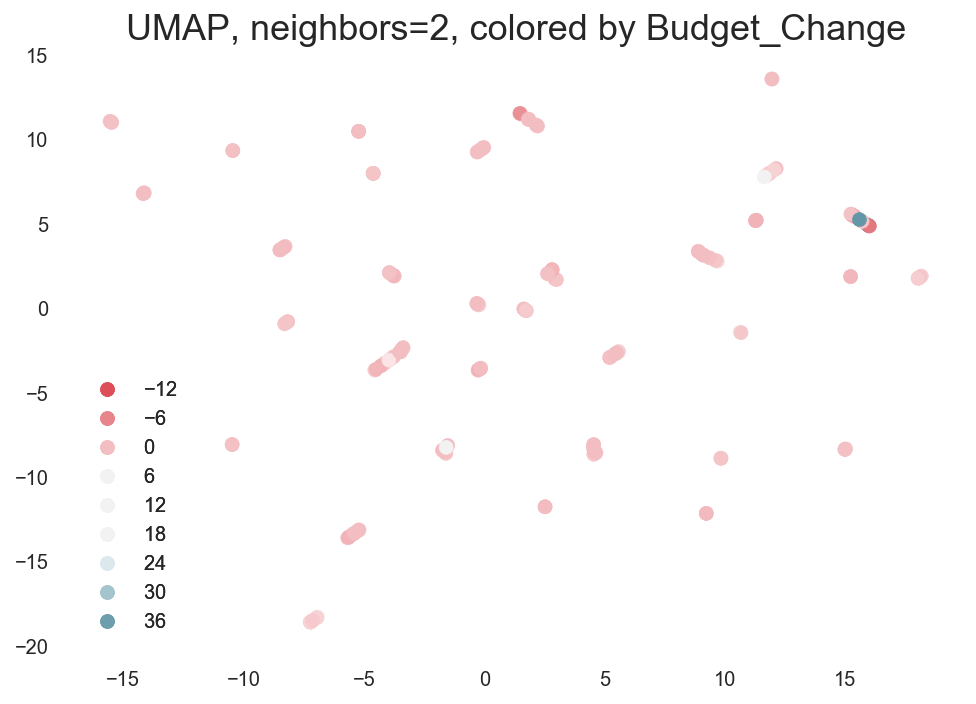

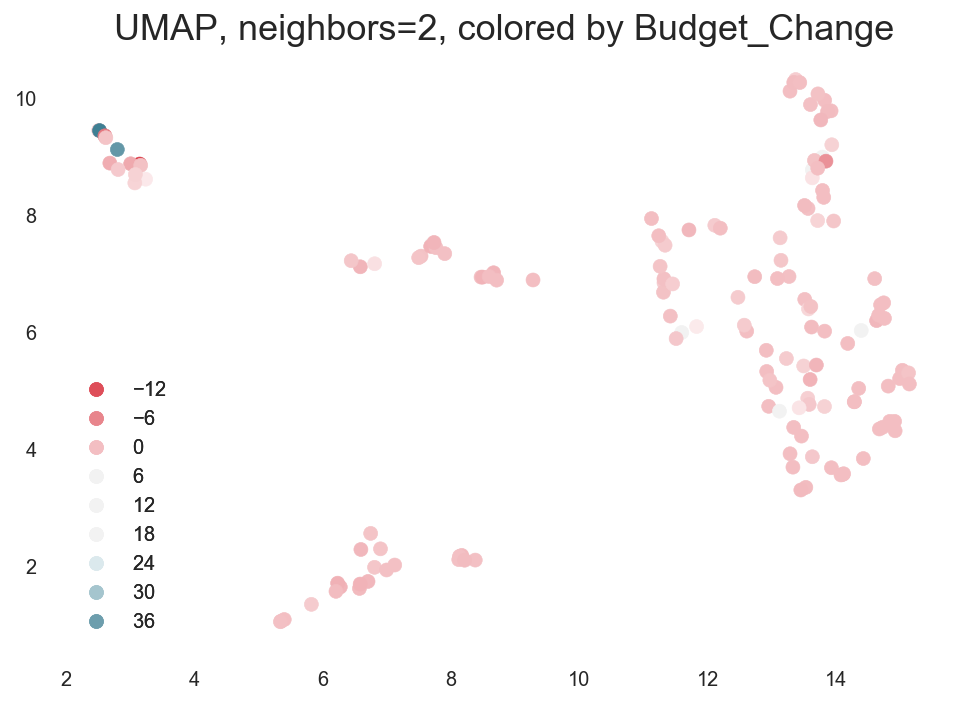

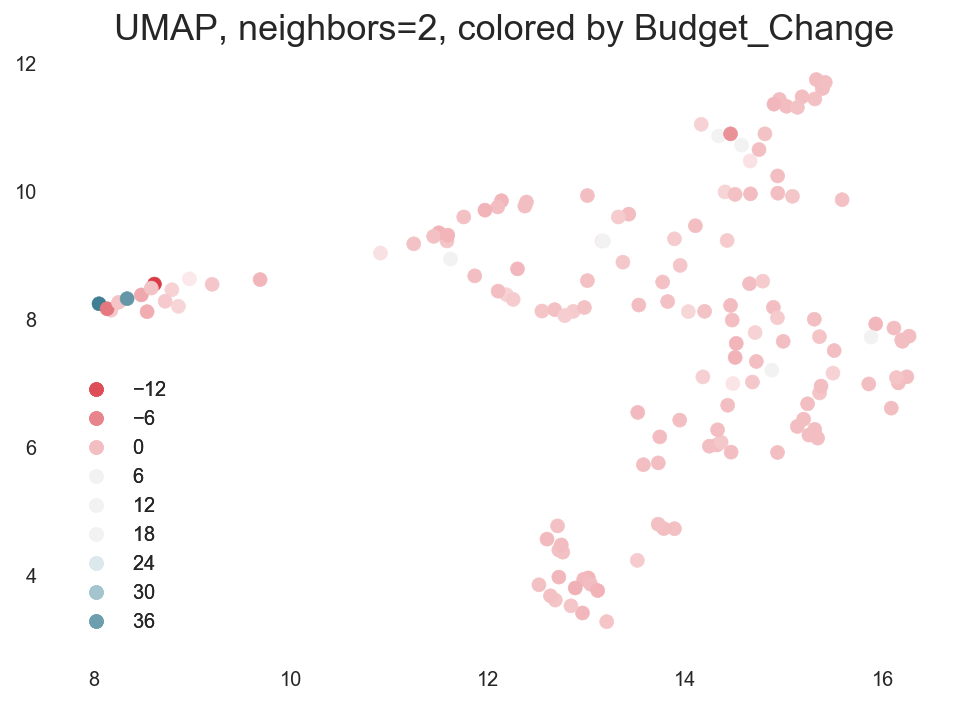

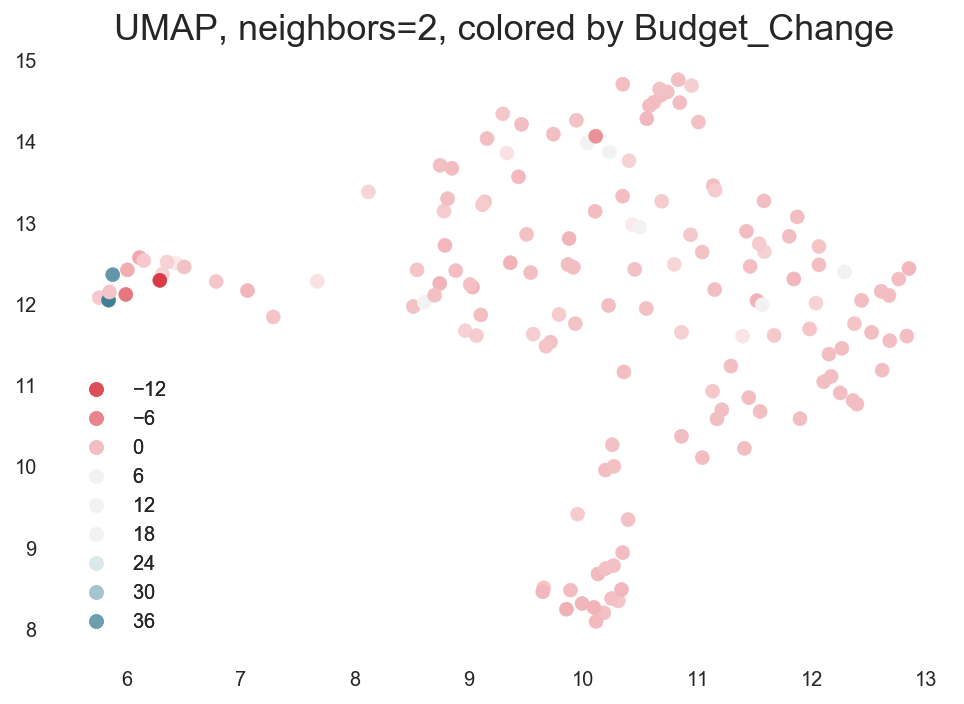

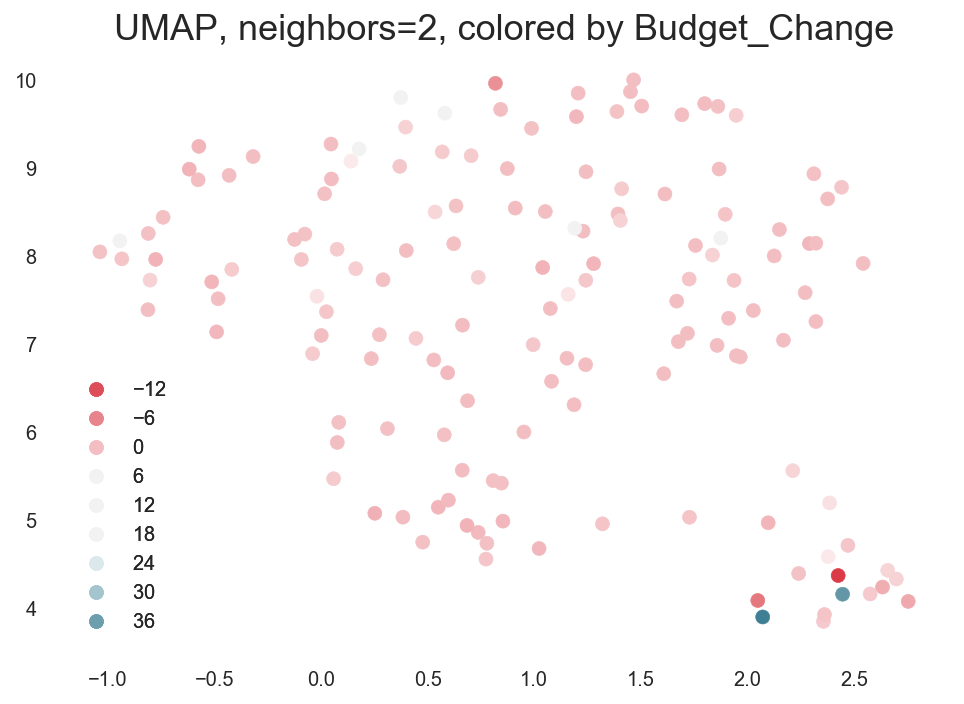

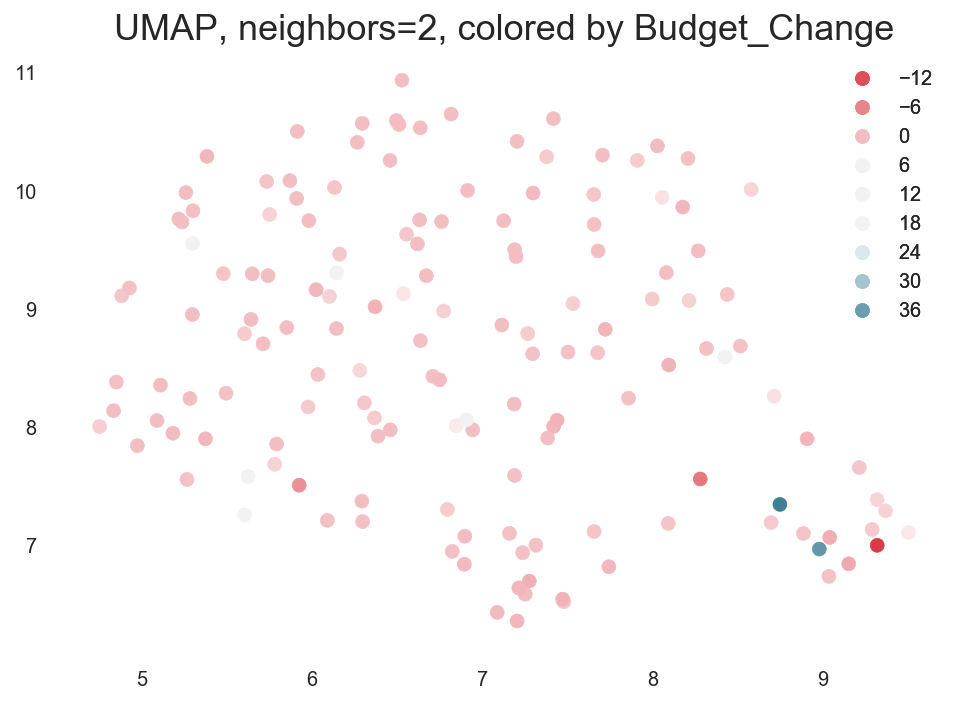

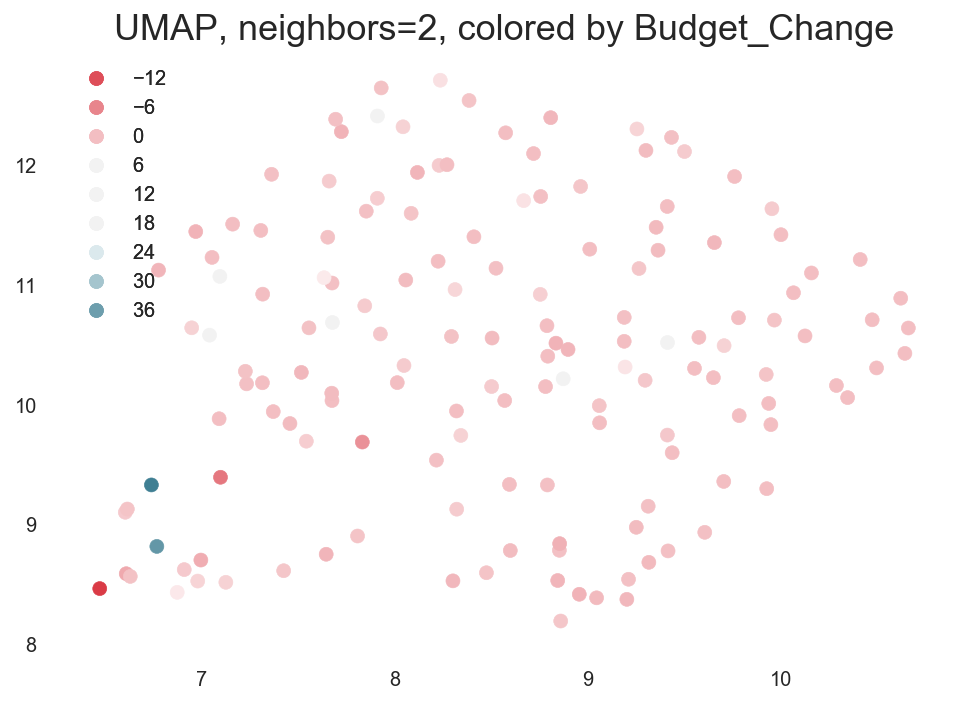

In [25]:
cmap = sns.diverging_palette(10, 220, sep=80, as_cmap=True) #sns.cubehelix_palette(as_cmap=True)

for n_neighbor in [2,5,10,20,50,100, 200]:
    utils.draw_umap(umap_df, n_neighbors=n_neighbor, c=dummified['Budget_Change'], cmap=cmap, title = f"UMAP, neighbors=2, colored by {dummified['Budget_Change'].name}")

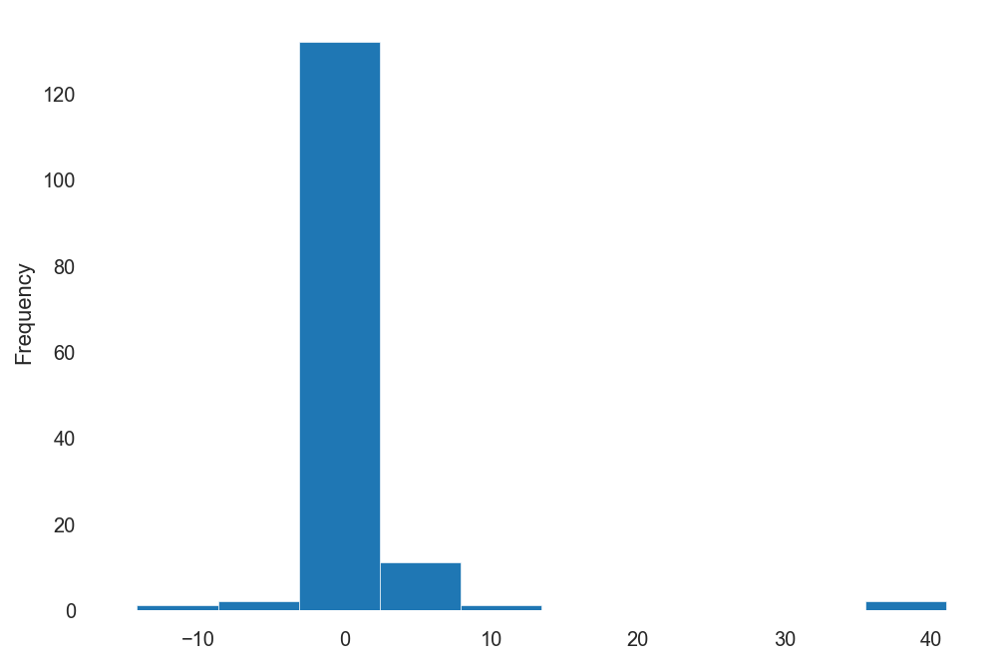

In [26]:
dummified['Budget_Change'].plot.hist()

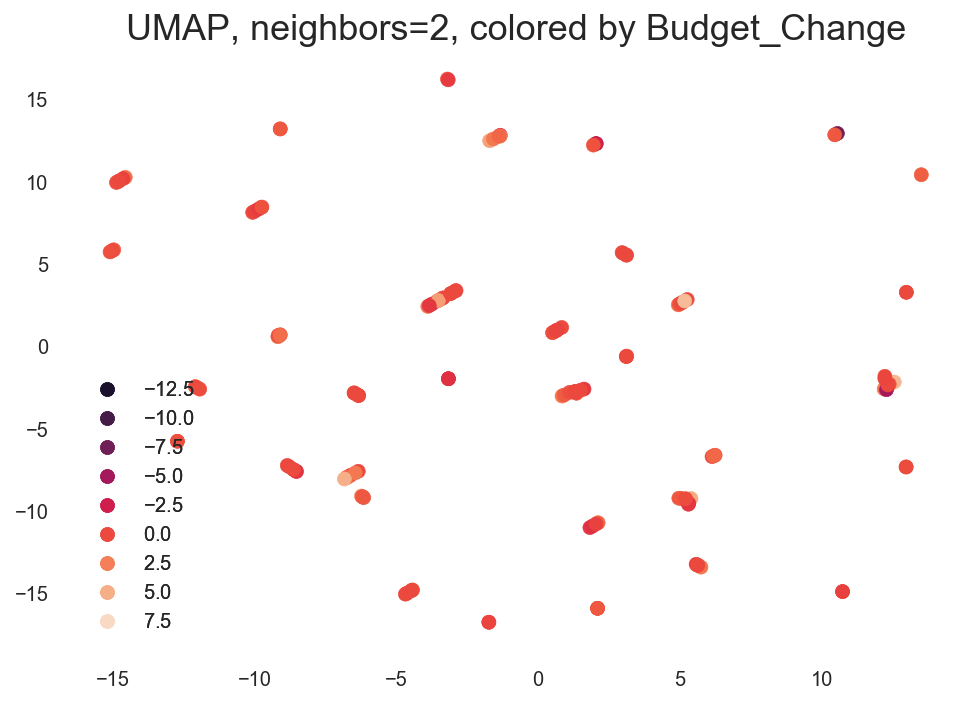

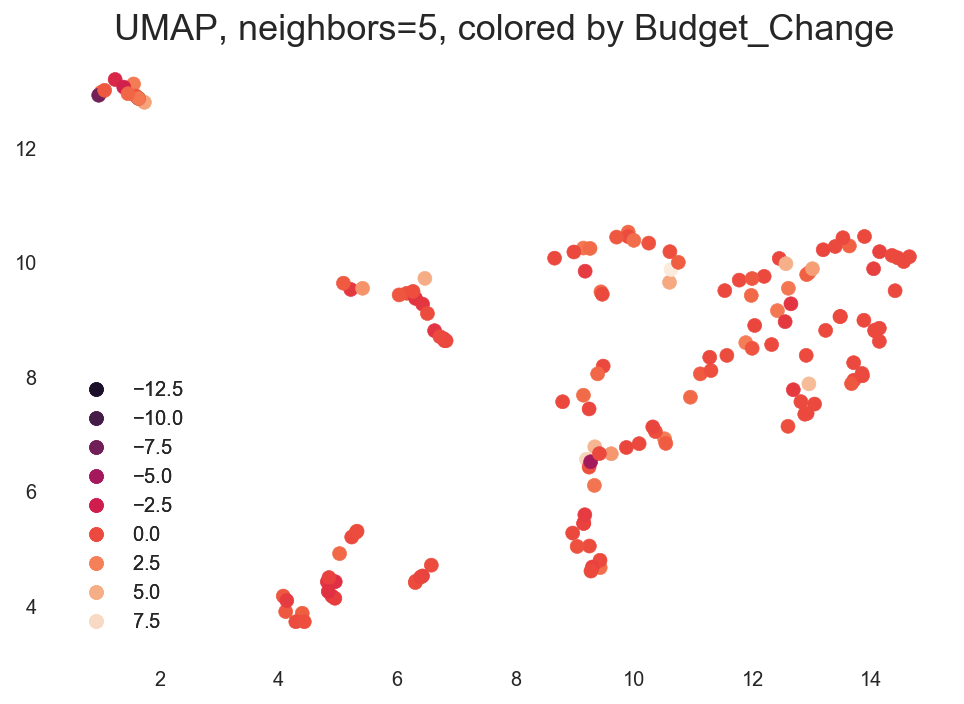

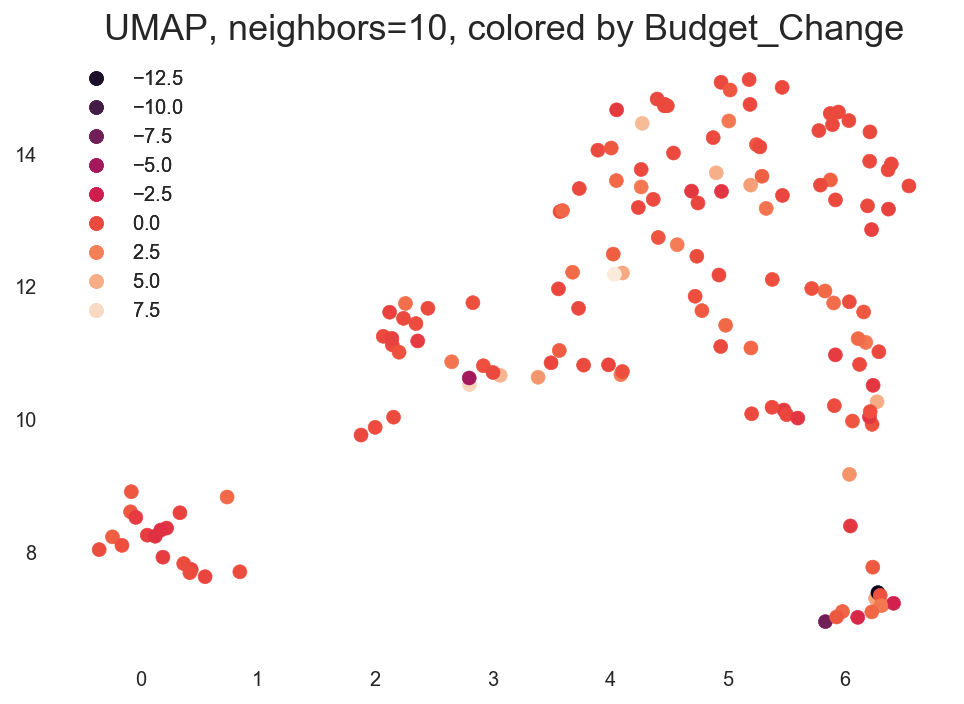

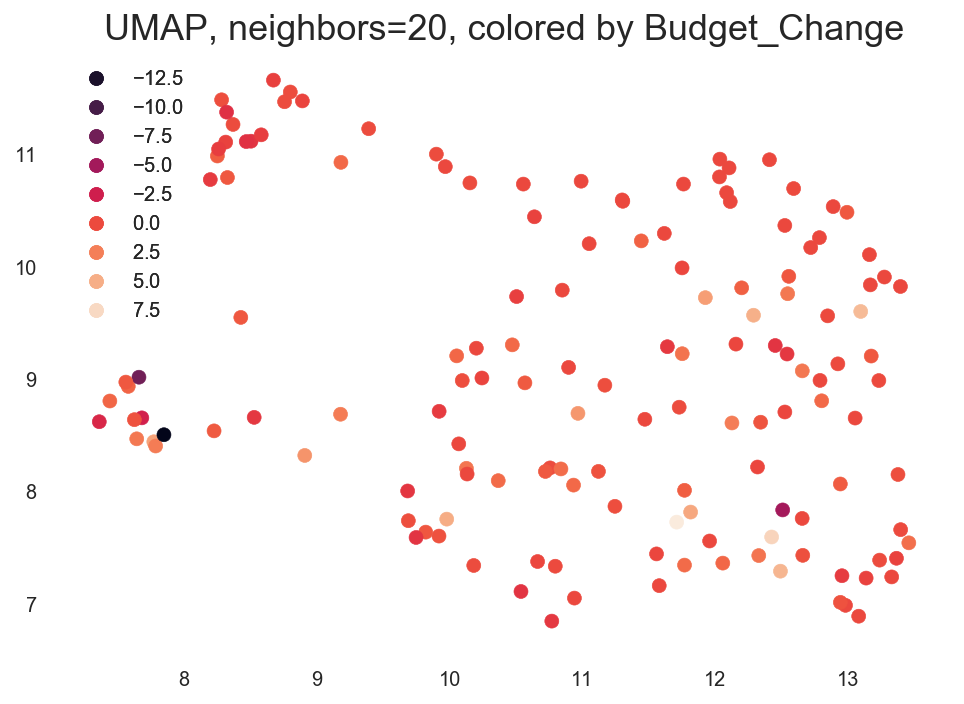

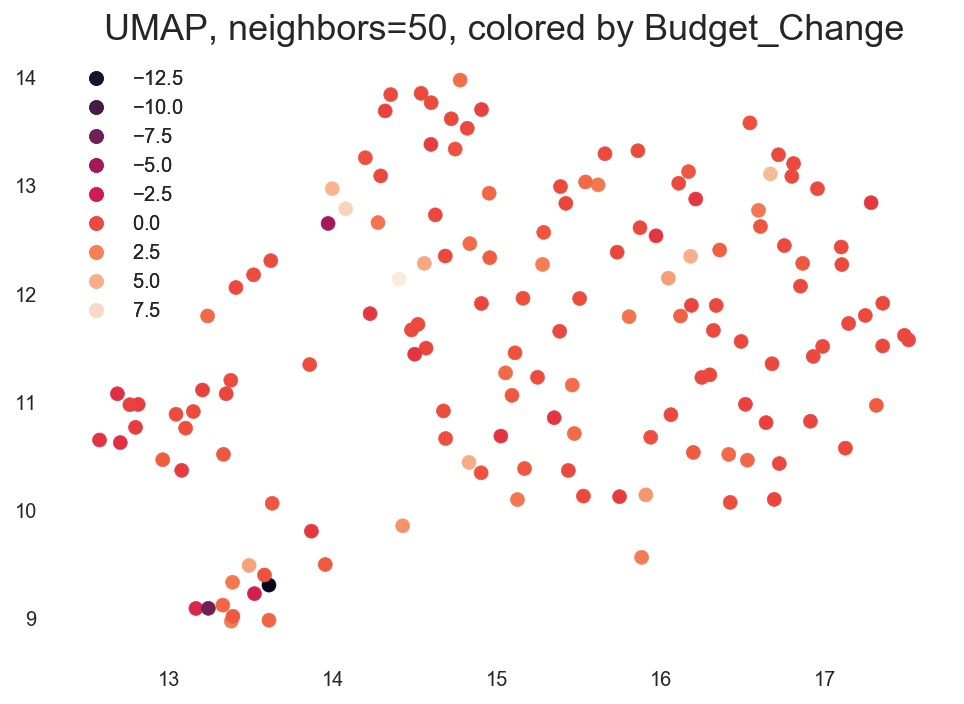

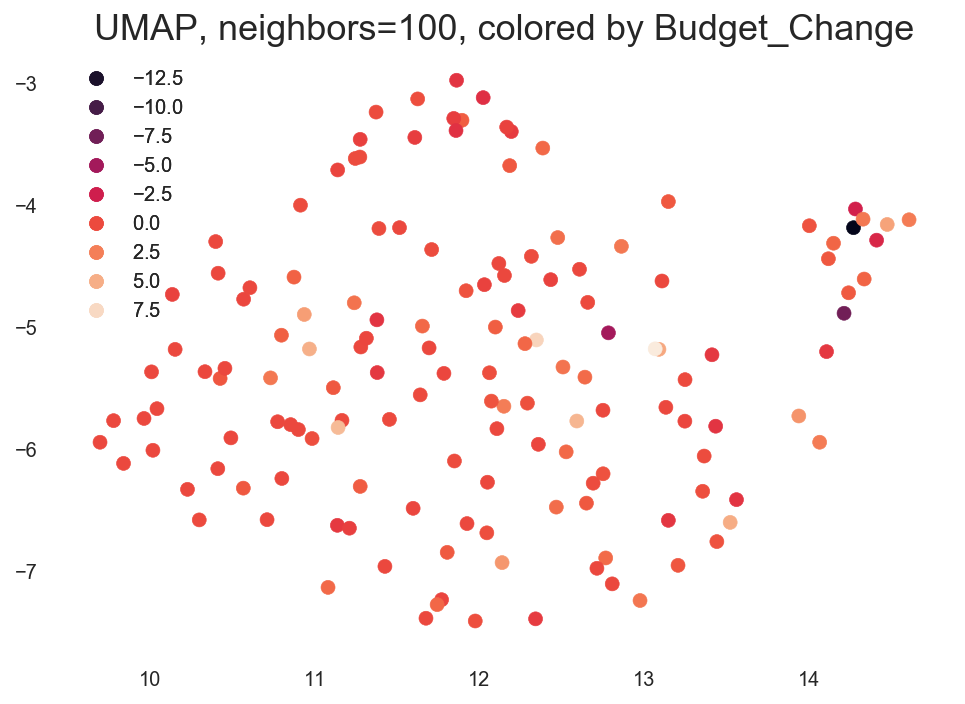

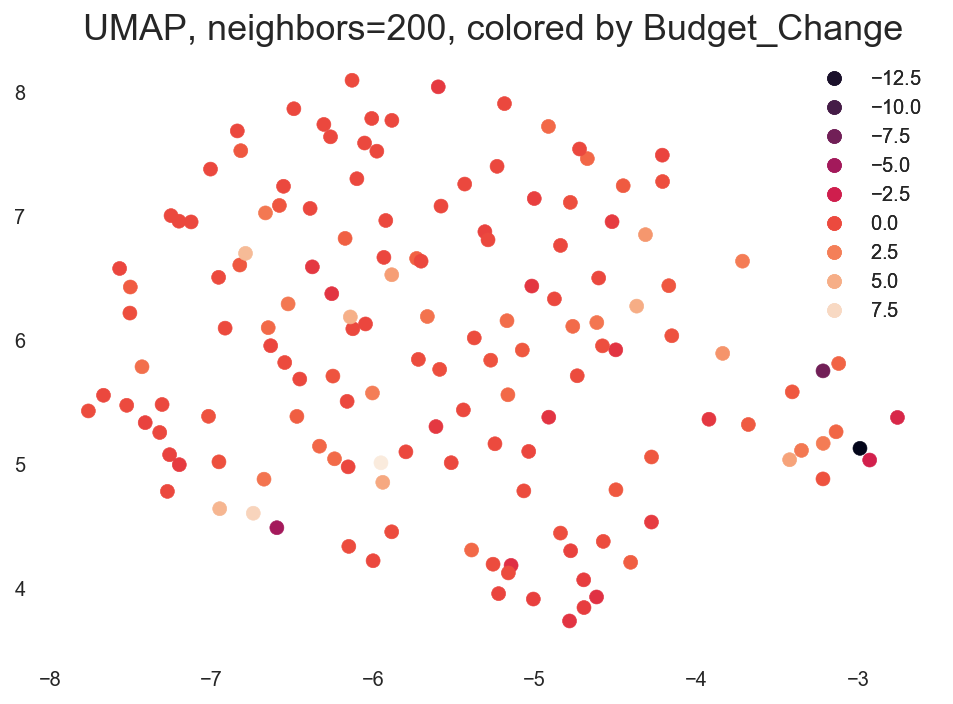

In [27]:
#remove outliers
for n_neighbor in [2,5,10,20,50,100, 200]:
    filter_cond = dummified['Budget_Change']< 20
    utils.draw_umap(umap_df.loc[filter_cond,:], n_neighbors=n_neighbor, c=dummified['Budget_Change'][filter_cond], title = f"UMAP, neighbors={n_neighbor}, colored by {dummified['Budget_Change'].name}")

In [28]:
scaled_df['Schedule_Change'][filter_cond]

0     -0.270609
1      0.164875
2      0.008961
3     -0.652330
4      0.155914
         ...   
144   -0.433692
145   -0.433692
146   -0.433692
147   -0.433692
148   -0.433692
Name: Schedule_Change, Length: 147, dtype: float64

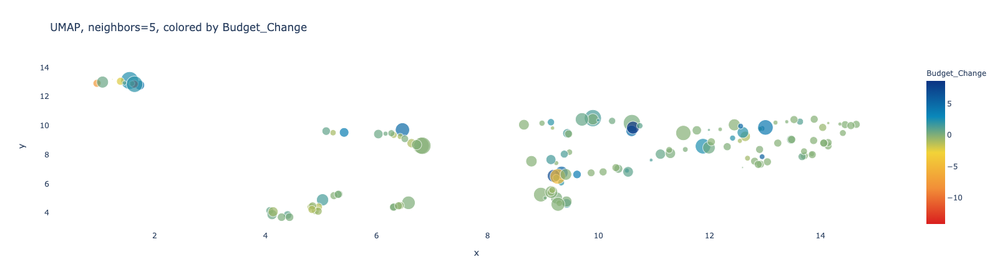

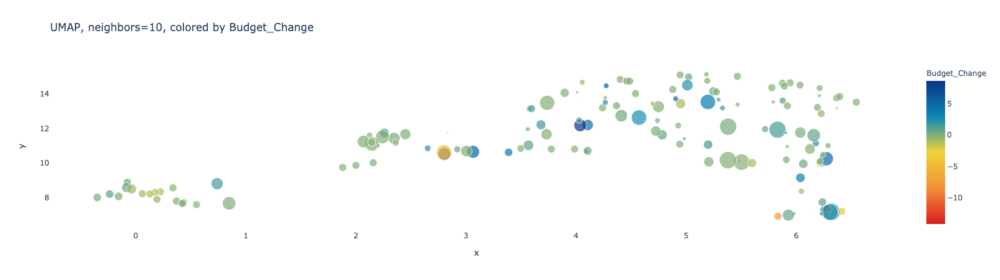

In [29]:
#use plotly
for n_neighbor in [5,10]:
    filter_cond = dummified['Budget_Change']< 20
    color = dummified['Budget_Change'][filter_cond]
    size = scaled_df['Schedule_Change'][filter_cond].abs()# size can't be negative
    
    utils.draw_umap(umap_df.loc[filter_cond,:], n_neighbors=n_neighbor, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, labels={"color":color.name, "size": size.name})

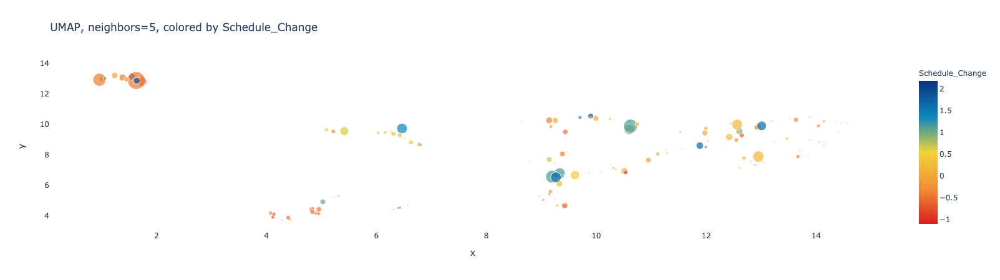

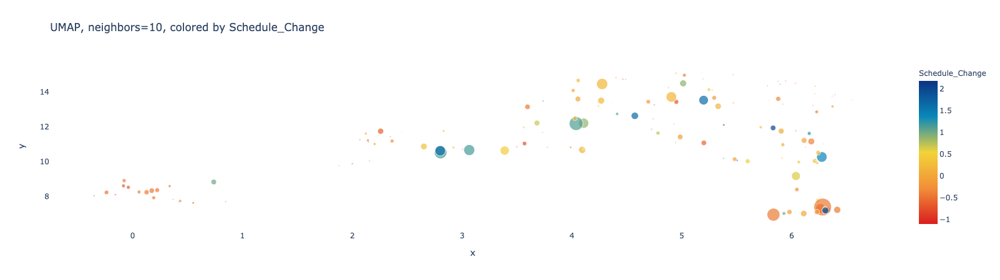

In [30]:
for n_neighbor in [5,10]:
    filter_cond = dummified['Budget_Change']< 20
    color = dummified['Schedule_Change'][filter_cond]
    size = scaled_df['Budget_Change'][filter_cond].abs()# size can't be negative
    
    utils.draw_umap(umap_df.loc[filter_cond,:], n_neighbors=n_neighbor, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, labels={"color":color.name, "size": size.name})

In [31]:
umap_df.columns[umap_df.columns.str.lower().str.contains("budget")]

Index(['Budget_Start'], dtype='object')

In [32]:
len(umap_df.drop(columns="Budget_Start").loc[filter_cond,:].columns)

68

In [33]:
umap_df.drop(columns="Budget_Start").loc[filter_cond,:].columns

Index(['Borough_Bronx', 'Borough_Brooklyn', 'Borough_Brooklyn, Queens',
       'Borough_Citywide', 'Borough_Manhattan', 'Borough_Manhattan, Bronx',
       'Borough_Manhattan, Staten Island, Bronx', 'Borough_Marlboro',
       'Borough_New York', 'Borough_Olive', 'Borough_Port Jervis',
       'Borough_Queens', 'Borough_Staten Island', 'Borough_Valhalla',
       'Borough_not_specified', 'Category_Arts and Culture',
       'Category_Bridges', 'Category_Bridges, Streets and Roadways',
       'Category_Ferries', 'Category_Health and Hospitals',
       'Category_Industrial Development',
       'Category_Industrial Development, Parks',
       'Category_Other Government Facilities', 'Category_Parks',
       'Category_Parks, Streets and Roadways',
       'Category_Public Safety and Criminal Justice', 'Category_Sanitation',
       'Category_Schools', 'Category_Sewers', 'Category_Streets and Roadways',
       'Category_Wastewater Treatment', 'Category_Water Supply',
       'Client_Agency_BWS', 'Cl

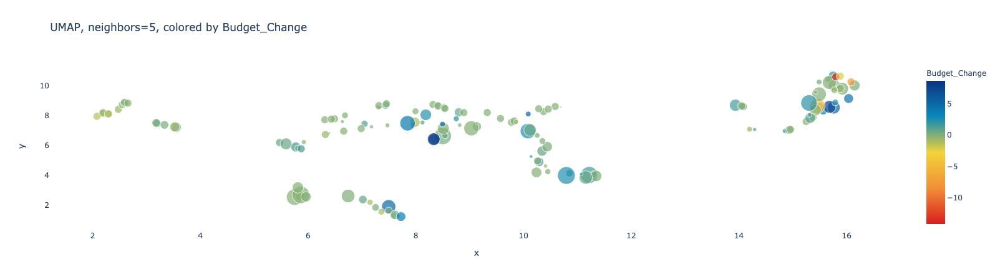

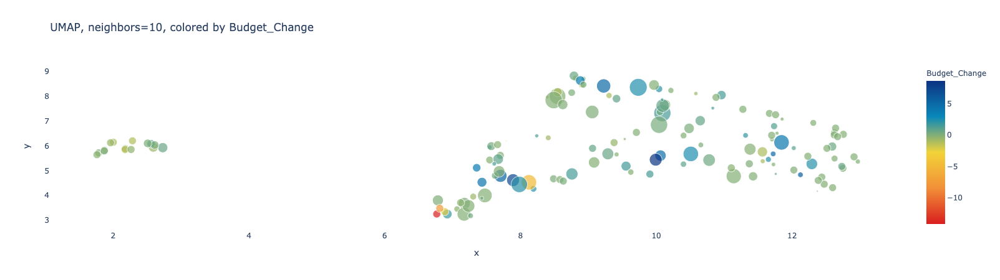

In [34]:
#drop budget_start

for n_neighbor in [5,10]:
    filter_cond = dummified['Budget_Change']< 20
    color = dummified['Budget_Change'][filter_cond]
    size = scaled_df['Schedule_Change'][filter_cond].abs()# size can't be negative
    
    utils.draw_umap(umap_df.drop(columns="Budget_Start").loc[filter_cond,:], n_neighbors=n_neighbor, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, labels={"color":color.name, "size": size.name})
                                

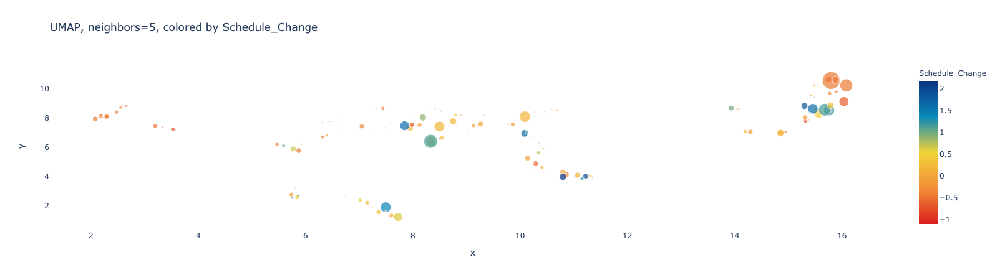

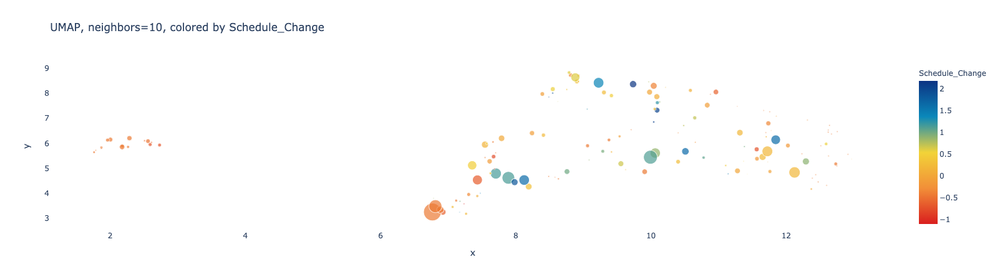

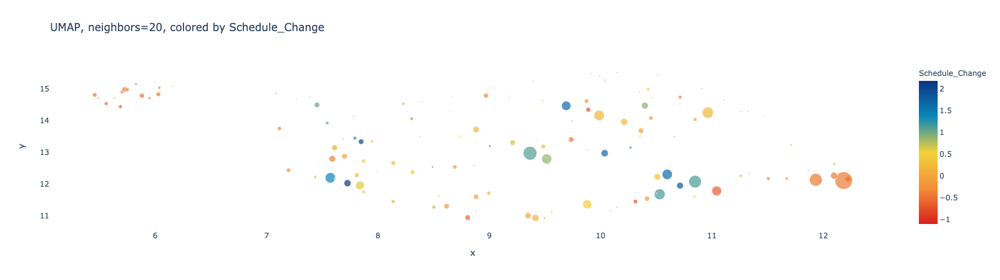

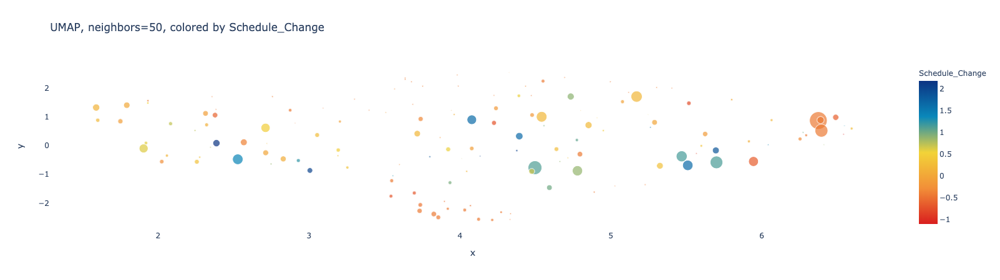

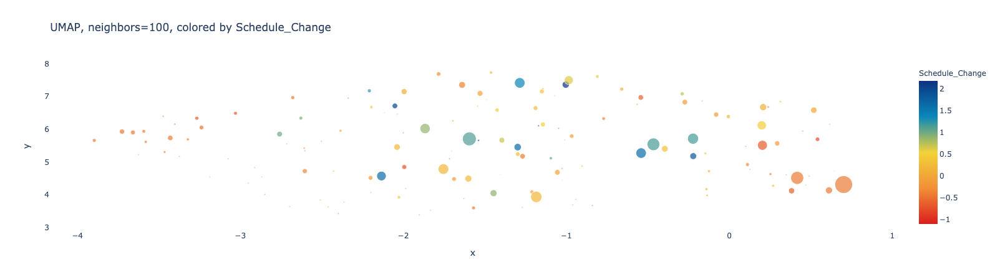

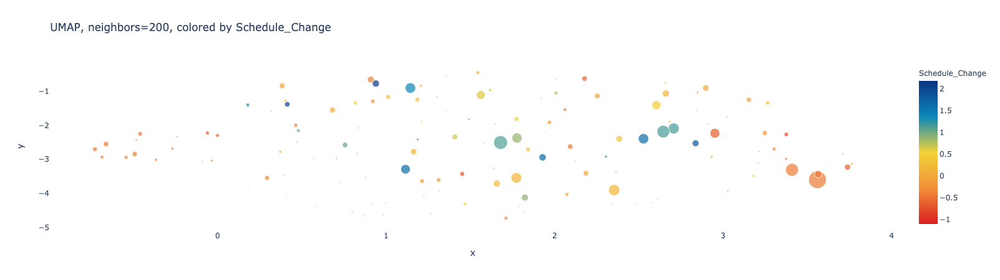

In [35]:
for n_neighbor in [5,10,20,50,100, 200]:
    filter_cond = dummified['Budget_Change']< 20
    color = dummified['Schedule_Change'][filter_cond]
    size = scaled_df['Budget_Change'][filter_cond].abs()# size can't be negative
    hover_name = scaled_df["PID"][filter_cond]
    symbol = scaled_df["Category"][filter_cond]
    
    utils.draw_umap(umap_df.drop(columns="Budget_Start").loc[filter_cond,:], n_neighbors=n_neighbor, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"})

In [36]:
interesting_group = [812, 673, 813, 680, 817, 815, 816, 866, 864, 868]
df.query("PID in @interesting_group")

,PID,Project_Name,Description,Category,Borough,Managing_Agency,Client_Agency,Phase_Start,Current_Project_Years,Current_Project_Year,...,Schedule_Change,Budget_Change,Schedule_Change_Ratio,Budget_Change_Ratio,Budget_Abs_Per_Error,Budget_Rel_Per_Error,Duration_End_Ratio,Budget_End_Ratio,Duration_Ratio_Inv,Budget_Ratio_Inv
109,673,Queens Public School 419 New Constrcution,Design and construction of a new school,Schools,Staten Island,SCA,DOE,3-Construction Procurement,2.288890,3,...,0,-17989768.0,0.0,-0.187131,0.230211,0.187131,1.0,0.812869,0.0,0.230211
110,680,Queens Public School 129 Addition,Design and construction of a new school,Schools,Queens,SCA,DOE,3-Construction Procurement,2.579108,3,...,0,-9763324.0,0.0,-0.154692,0.183001,0.154692,1.0,0.845308,0.0,0.183001
132,812,Brooklyn Public School 127 Addition,Design and construction of a new school,Schools,Brooklyn,SCA,DOE,3-Construction Procurement,2.132830,3,...,0,-24805809.0,0.0,-0.274457,0.378278,0.274457,1.0,0.725543,0.0,0.378278
133,813,Brooklyn PS/IS @ 3269 Atlantic Ave New Constru...,Design and construction of a new school,Schools,Brooklyn,SCA,DOE,3-Construction Procurement,2.576370,3,...,0,-5630761.0,0.0,-0.054820,0.057999,0.054820,1.0,0.945180,0.0,0.057999
134,815,Queens Public School @ Parcel F,Design and construction of a new school,Schools,Queens,SCA,DOE,4-Construction,2.792665,3,...,0,-10852601.0,0.0,-0.118485,0.134410,0.118485,1.0,0.881515,0.0,0.134410
135,816,Staten Island D75 replacement @ 15 Fairfield N...,Design and construction of a new school,Schools,Staten Island,SCA,DOE,4-Construction,2.439475,3,...,0,-6089333.0,0.0,-0.119591,0.135835,0.119591,1.0,0.880409,0.0,0.135835
136,817,Queens Academy of American Studies,Design and construction of a new school,Schools,Queens,SCA,DOE,3-Construction Procurement,2.677673,3,...,0,-21721218.0,0.0,-0.185380,0.227567,0.185380,1.0,0.814620,0.0,0.227567
139,864,Bronx Public School 97 Addition,Design and construction of an addition to an e...,Schools,not_specified,SCA,DOE,4-Construction,2.086285,3,...,0,3185749.0,0.0,0.050790,0.048335,0.050790,1.0,1.050790,0.0,-0.048335
140,866,Brooklyn Public School 97 Addition,Design and construction of an addition to an e...,Schools,not_specified,SCA,DOE,4-Construction,2.083547,3,...,0,3423226.0,0.0,0.063739,0.059920,0.063739,1.0,1.063739,0.0,-0.059920
141,868,Queens Public School 256 Annex,Design and construction of a new school,Schools,not_specified,SCA,DOE,4-Construction,2.466854,3,...,0,-3769531.0,0.0,-0.088788,0.097439,0.088788,1.0,0.911212,0.0,0.097439


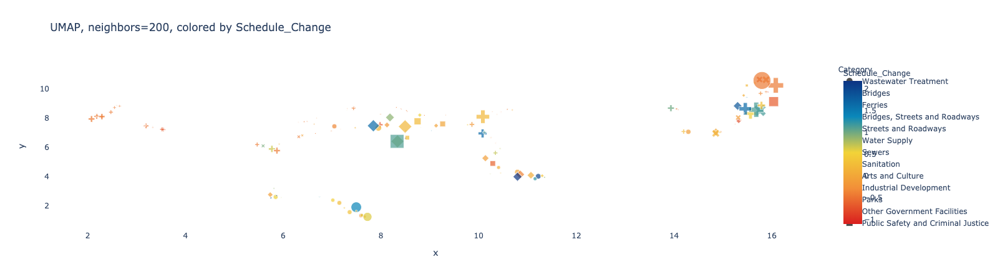

In [37]:
filter_cond = dummified['Budget_Change']< 20
color = dummified['Schedule_Change'][filter_cond]
size = scaled_df['Budget_Change'][filter_cond].abs()# size can't be negative
hover_name = scaled_df["PID"][filter_cond]
symbol = scaled_df["Category"][filter_cond]

utils.draw_umap(umap_df.drop(columns="Budget_Start").loc[filter_cond,:], n_neighbors=5, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, symbol = symbol, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"});


*NOTE: in graphs, optimize for being able to **stand alone**. When aggregating and putting things in presentations, you won't have to recreate and add code to each plot to make it understandable without the entire post around it. Will it be understandable without several paragraphs?*

### Putting Big Bold Headers with Clear Takeaways Will Help Us Aggregate Later

---

### Clustering

#### TL,DR

*NOTE: In the TL,DR, optimize for **clarity** and **comprehensiveness**. The goal is to convey the post with the least amount of friction, especially since ipython/beakers require much more scrolling than blog posts. Make the reader get a correct understanding of the post's takeaway, and the points supporting that takeaway without having to strain through paragraphs and tons of prose. Bullet points are great here, but are up to you. Try to avoid academic paper style abstracts.*

 - Having a specific title will help avoid having someone browse posts and only finding vague, similar sounding titles
 - Having an itemized, short, and clear tl,dr will help readers understand your content
 - Setting the reader's context with a motivation section makes someone understand how to judge your choices
 - Visualizations that can stand alone, via legends, labels, and captions are more understandable and powerful


### Motivation

*NOTE: optimize in this section for **context setting**, as specifically as you can. For instance, this post is generally a set of standards for work in the repo. The specific motivation is to have least friction to current workflow while being able to painlessly aggregate it later.*

The knowledge repo was created to consolidate research work that is currently scattered in emails, blogposts, and presentations, so that people didn't redo their work.

#### Create different embeddings to visualize the clustering on

In [38]:
viz_embedding_5, mapper = utils.draw_umap(umap_df.drop(columns="Budget_Start"), plot=False, n_neighbors=5, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, symbol = symbol, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"})
viz_embedding_10, mapper = utils.draw_umap(umap_df.drop(columns="Budget_Start"), plot=False, n_neighbors=10, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, symbol = symbol, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"})
viz_embedding_20, mapper = utils.draw_umap(umap_df.drop(columns="Budget_Start"), plot=False, n_neighbors=20, c=color, cmap=cmap, use_plotly =True, title = f"UMAP, neighbors={n_neighbor}, colored by {color.name}", size=size, color_continuous_scale=px.colors.diverging.Portland_r, hover_name = hover_name, symbol = symbol, labels={"color":color.name, "size": size.name, "hover_name":"PID", "symbol":"Category"})

#### Clustering on the raw data

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


min_cluster size: 2
found 37 clusters
fraction clustered: 0.6510067114093959


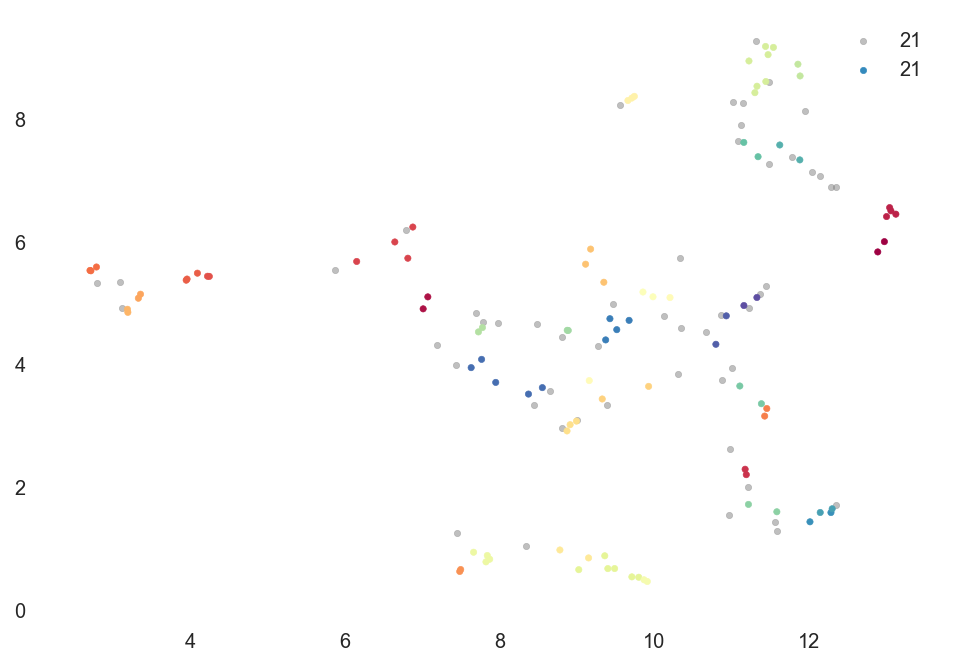

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


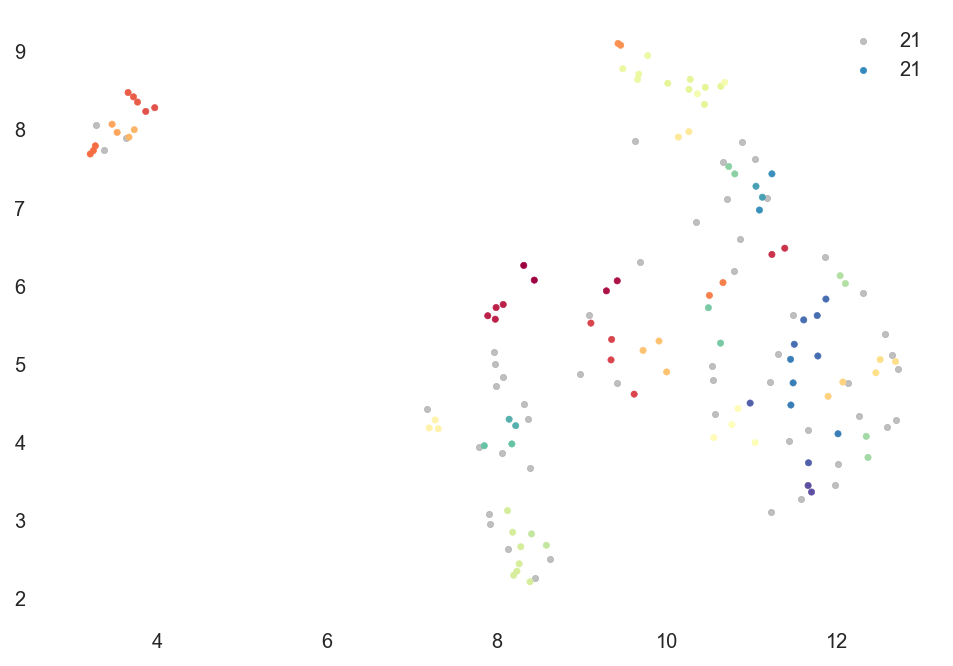

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


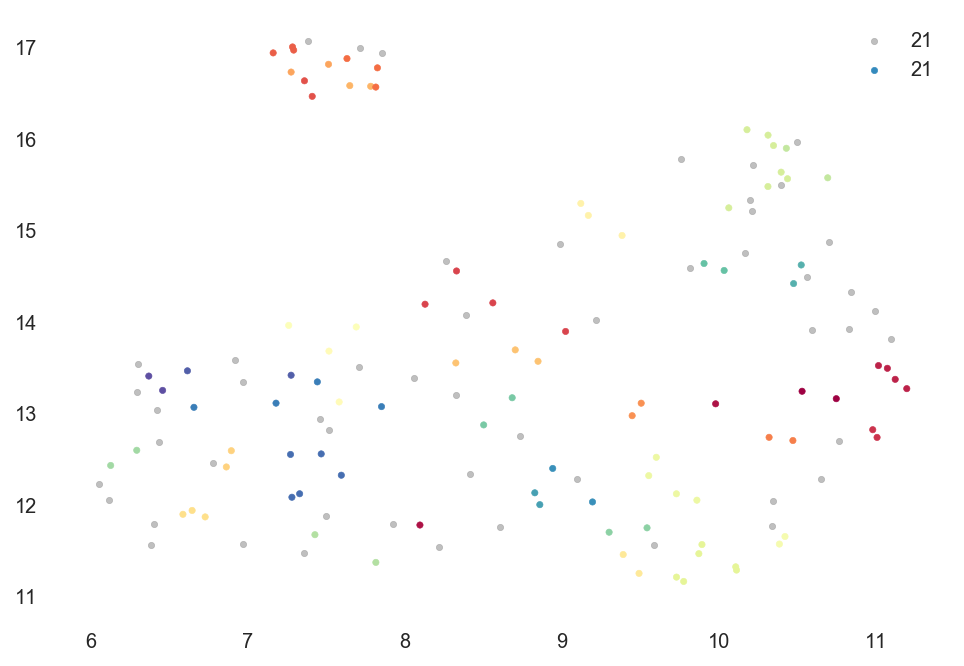

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


---------------
min_cluster size: 5
found 3 clusters
fraction clustered: 0.7046979865771812


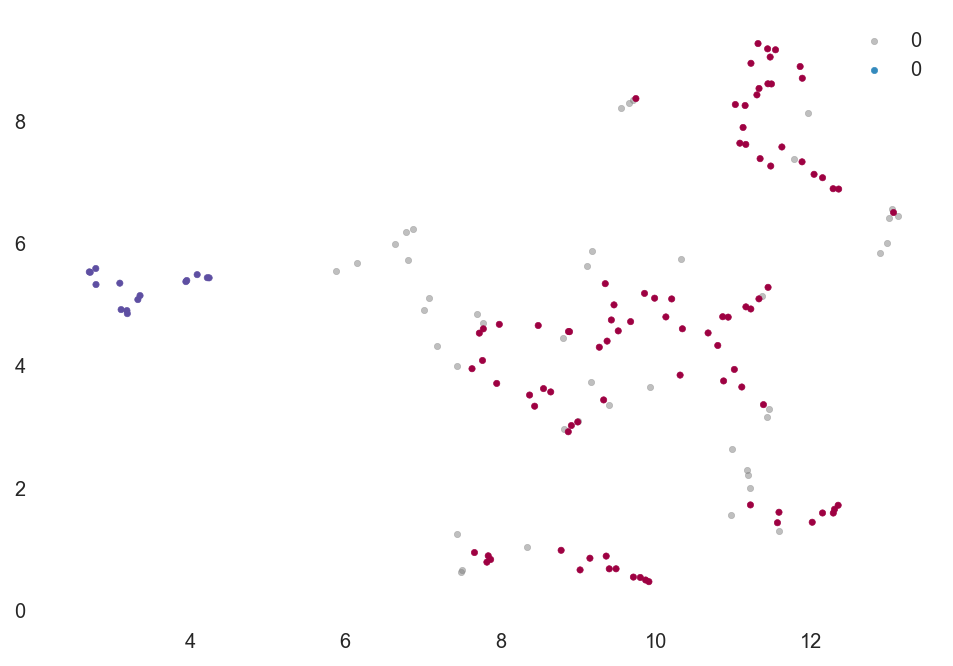

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


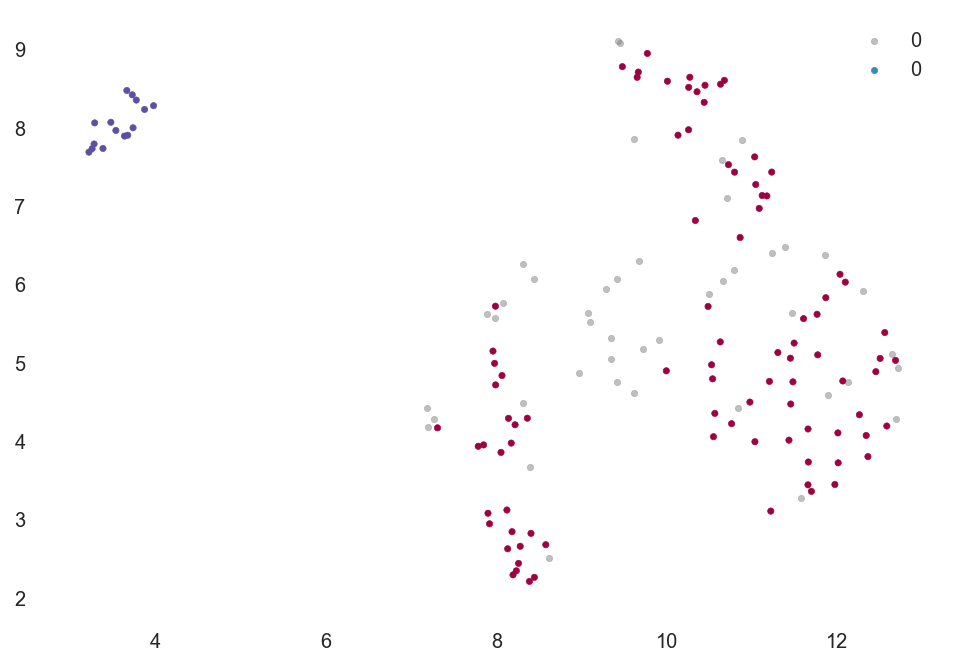

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


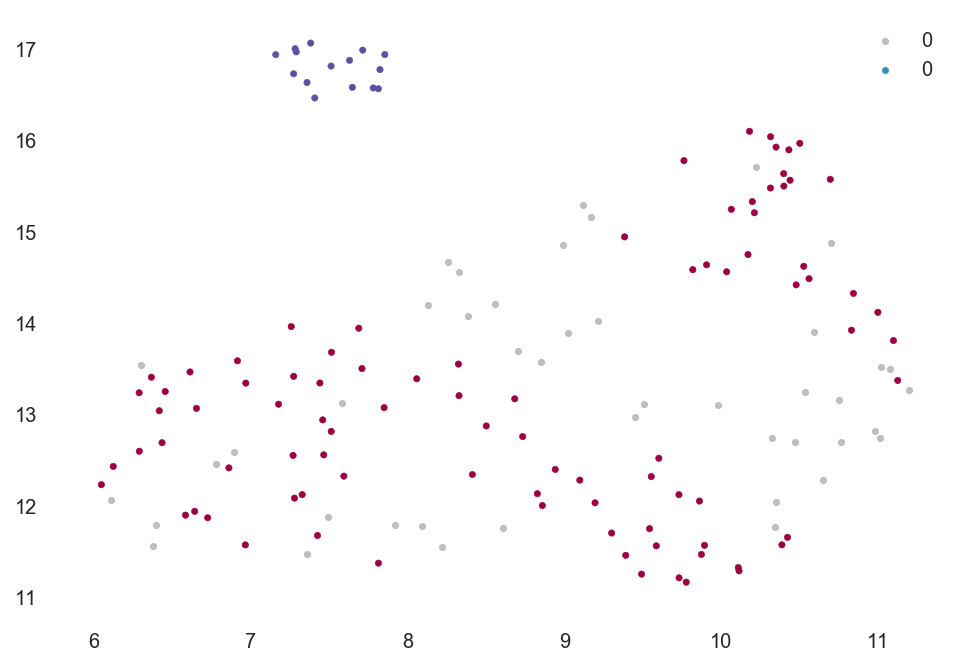

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


---------------
min_cluster size: 10
found 3 clusters
fraction clustered: 0.4899328859060403


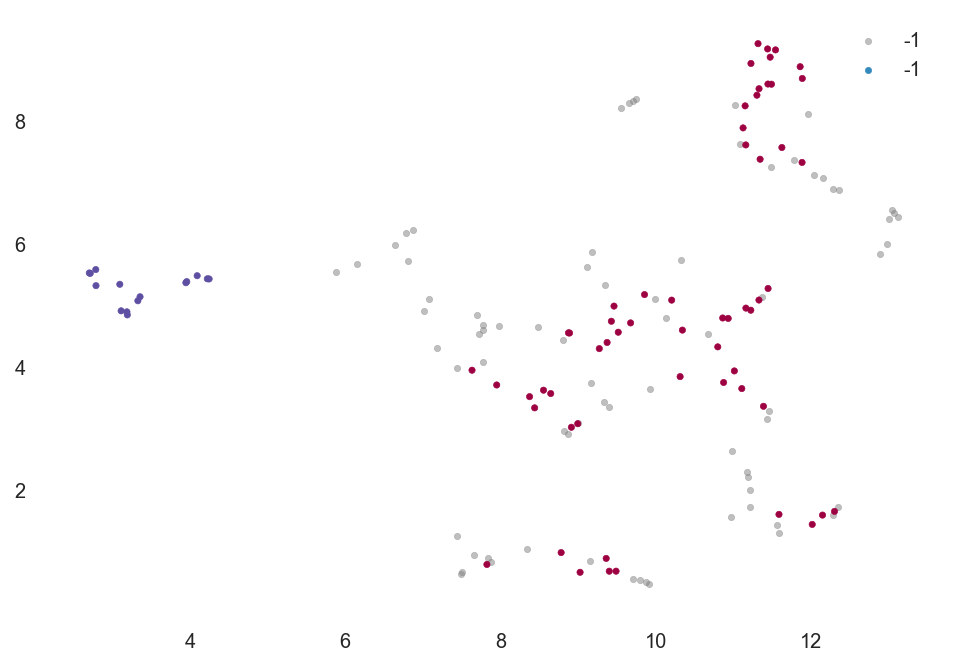

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


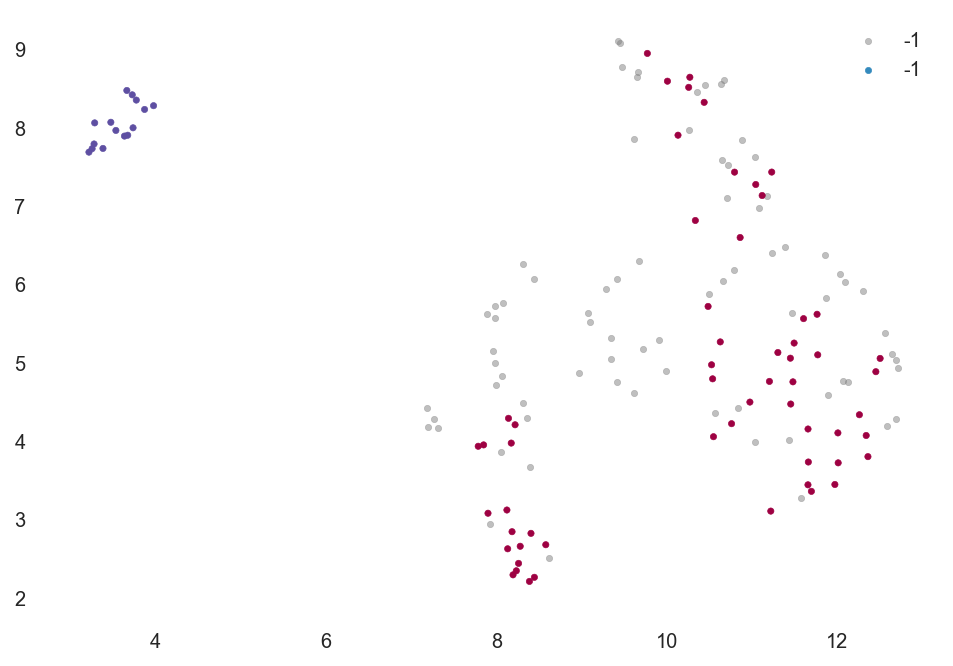

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


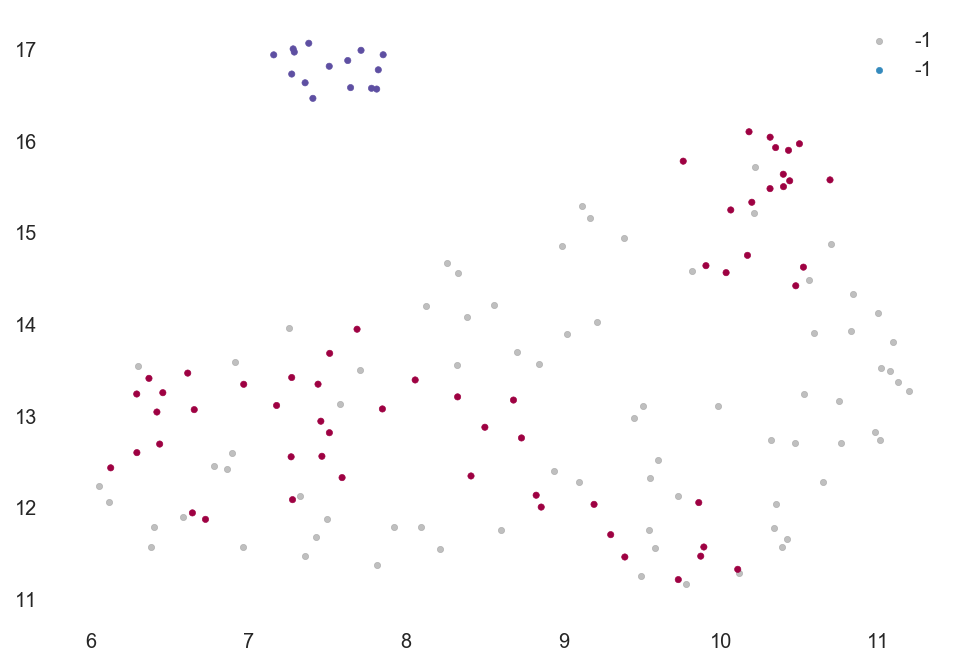

---------------


In [39]:
for min_cluster_size in [2,5,10]:
    utils.cluster_hdbscan(umap_df.drop(columns="Budget_Start"), min_cluster_size, [viz_embedding_5, viz_embedding_10, viz_embedding_20 ])
    print("---------------")

#### Clustering on output of UMAP 5 neighbors

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


min_cluster size: 2
found 30 clusters
fraction clustered: 0.8657718120805369


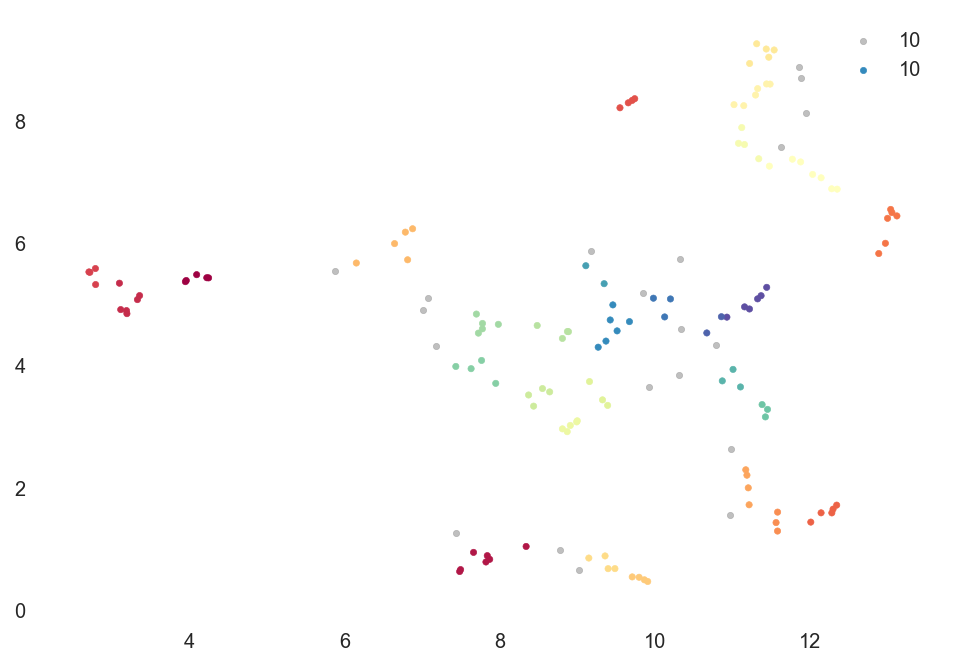

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


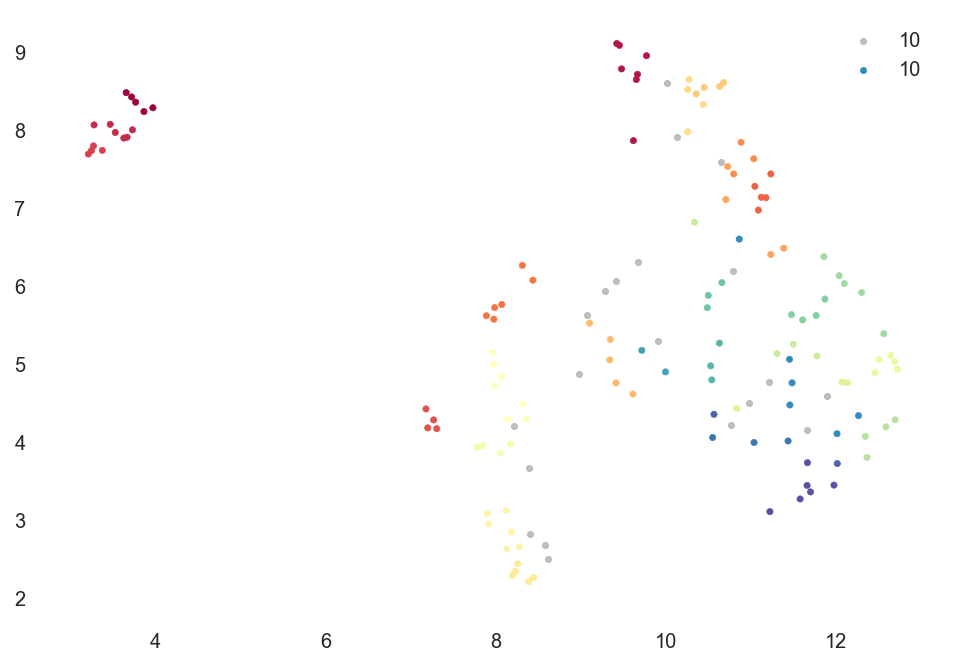

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


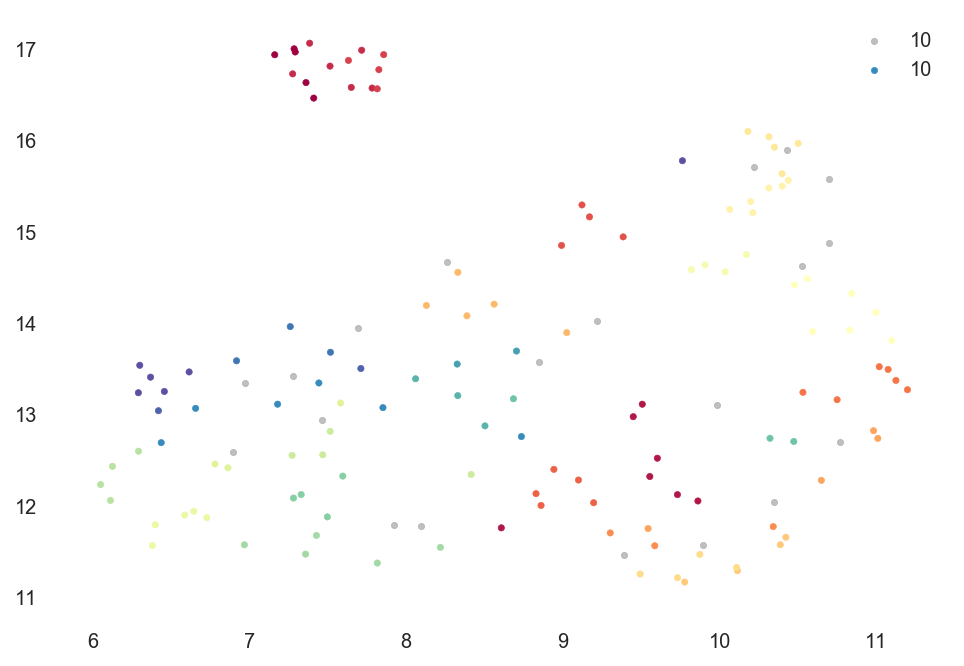

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


---------------
min_cluster size: 5
found 5 clusters
fraction clustered: 0.9932885906040269


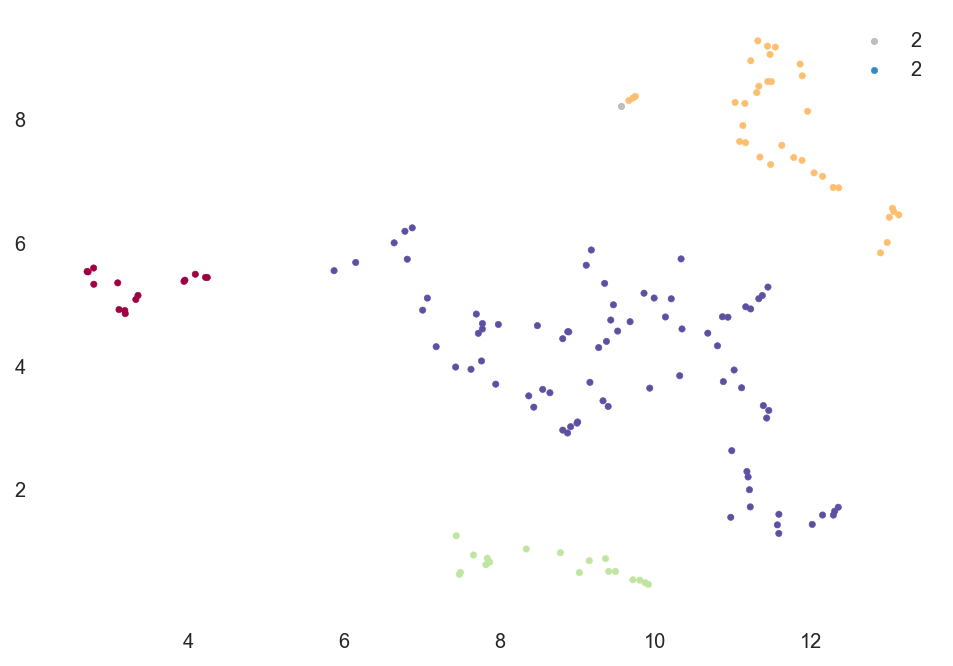

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


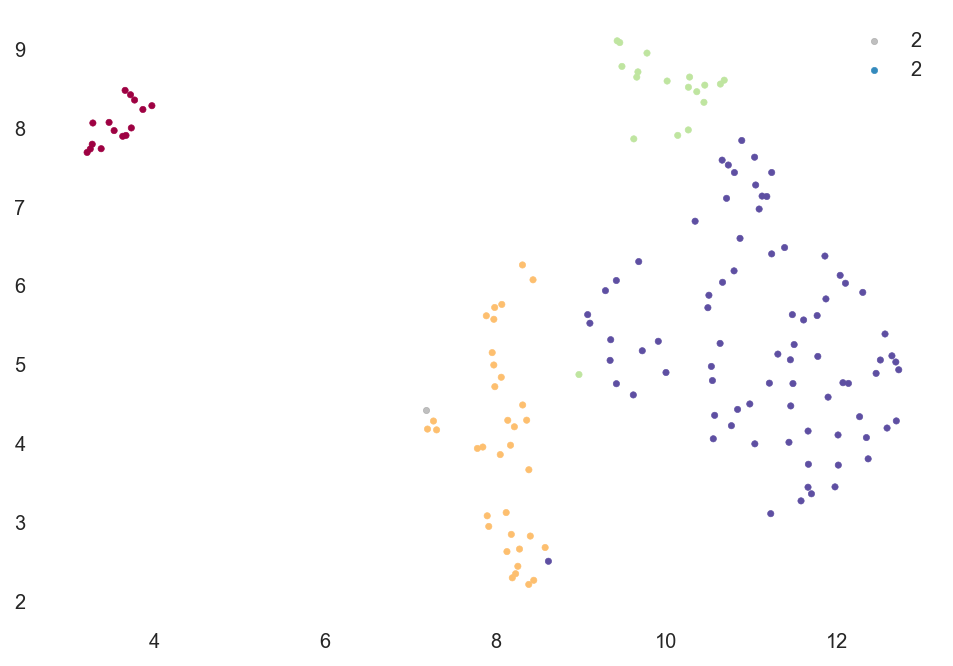

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


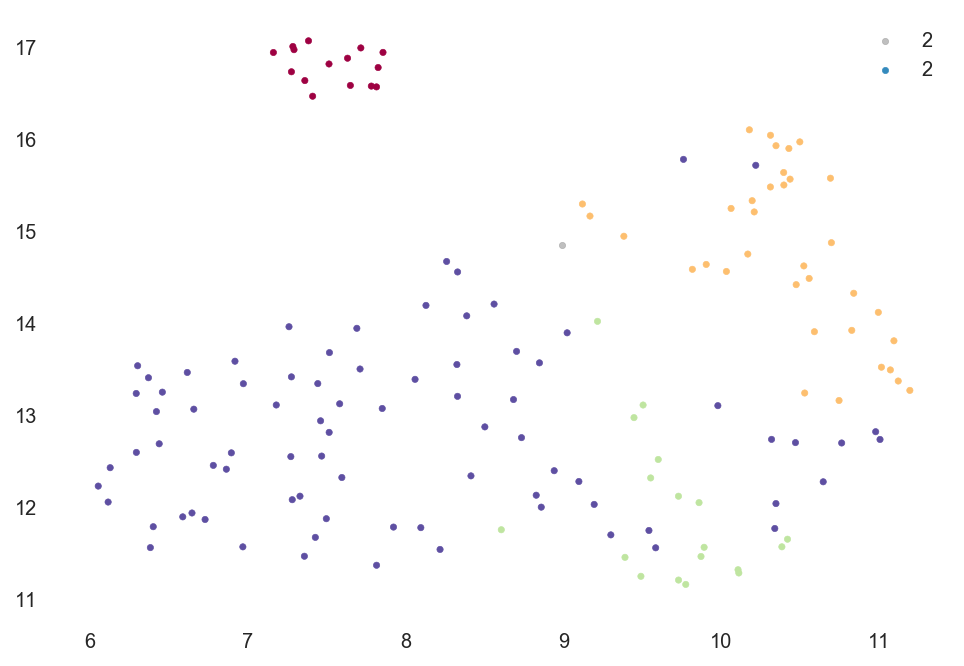

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


---------------
min_cluster size: 10
found 5 clusters
fraction clustered: 0.9060402684563759


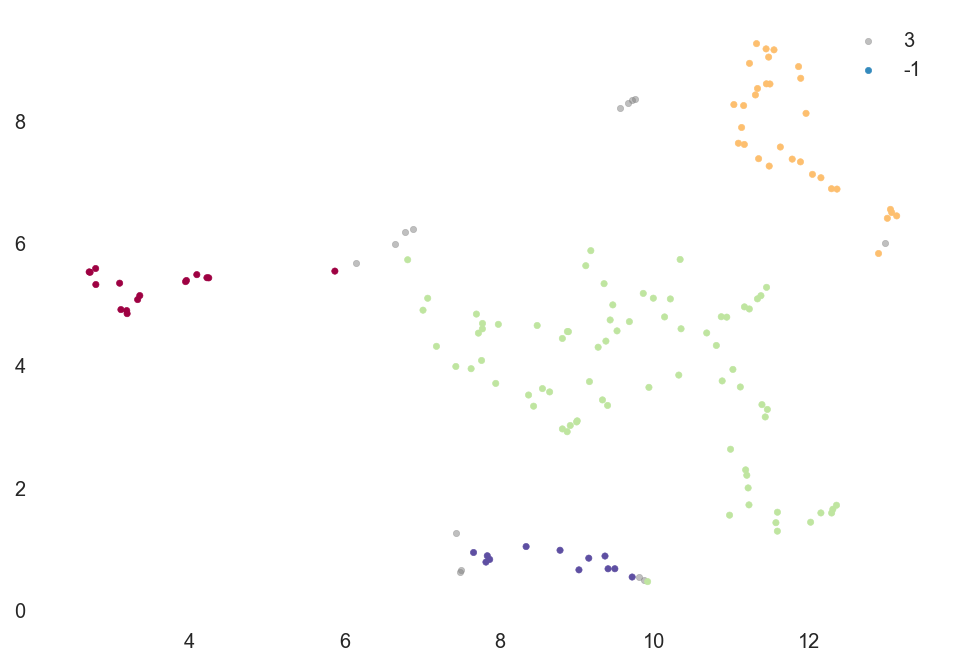

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


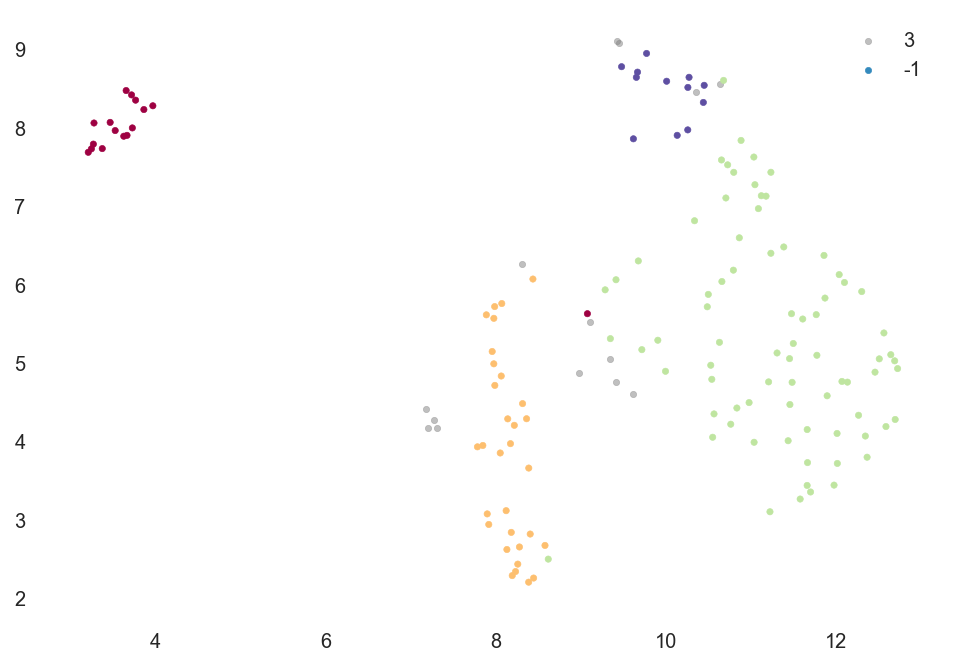

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


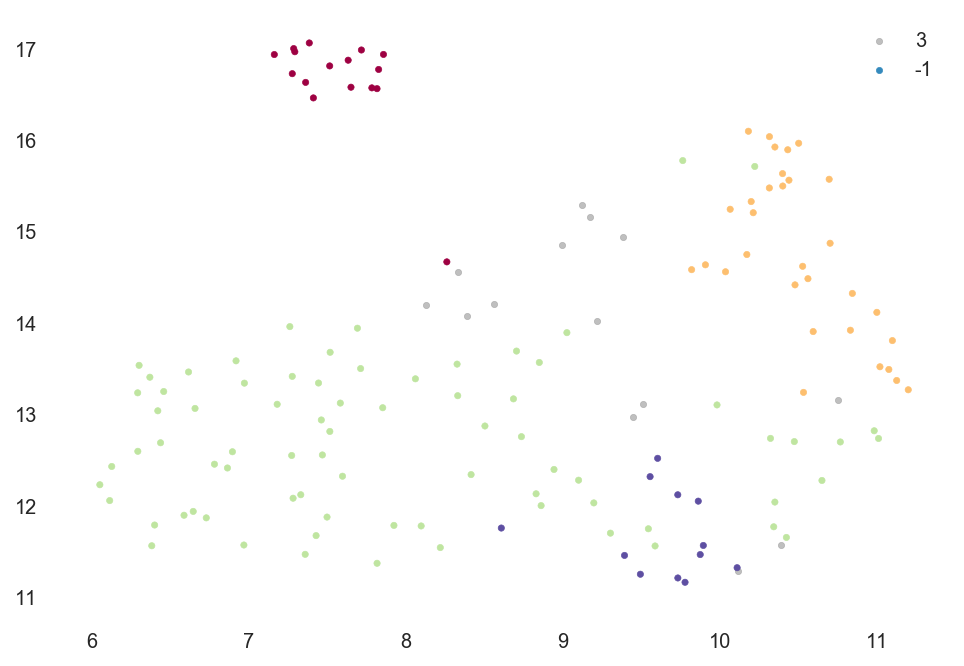

---------------


In [40]:
for min_cluster_size in [2,5,10]:
    utils.cluster_hdbscan(viz_embedding_5, min_cluster_size, [viz_embedding_5, viz_embedding_10, viz_embedding_20 ])
    print("---------------")

#### Clustering on UMAP output 10 neighbors:

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


min_cluster size: 2
found 23 clusters
fraction clustered: 0.8791946308724832


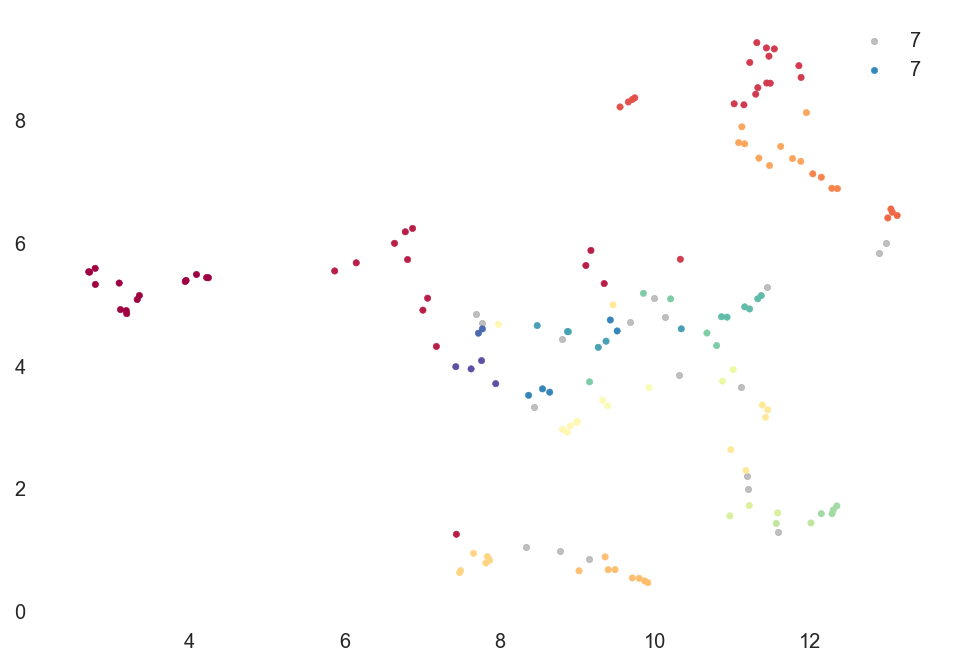

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


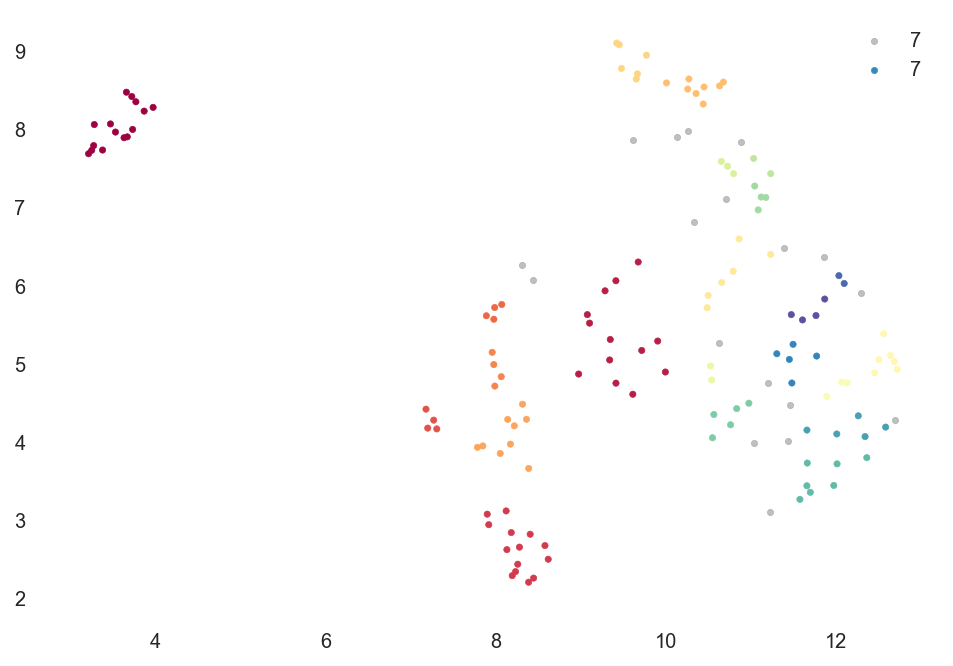

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


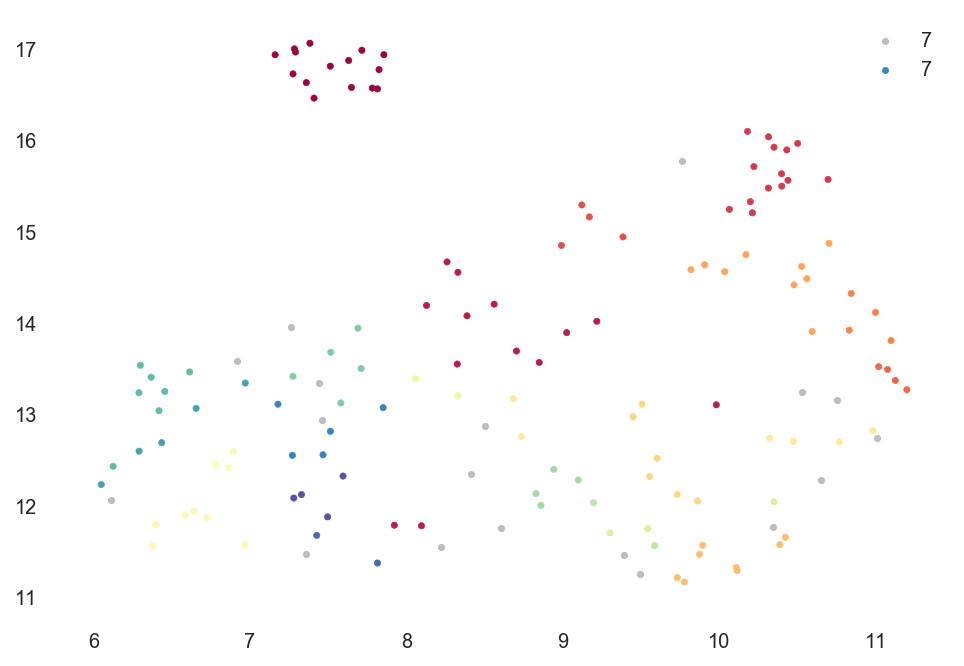

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


---------------
min_cluster size: 5
found 2 clusters
fraction clustered: 1.0


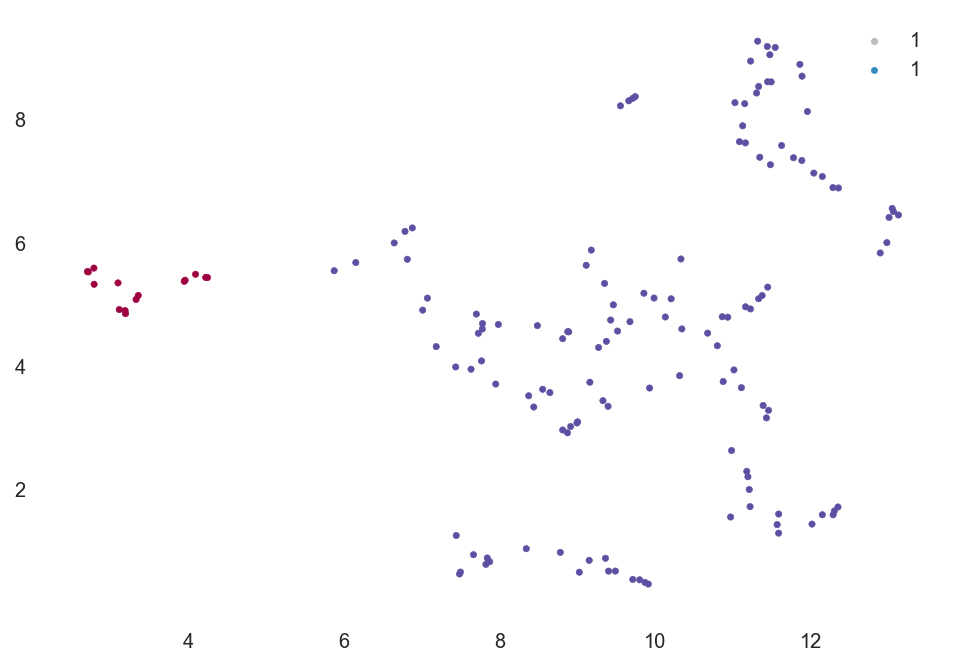

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


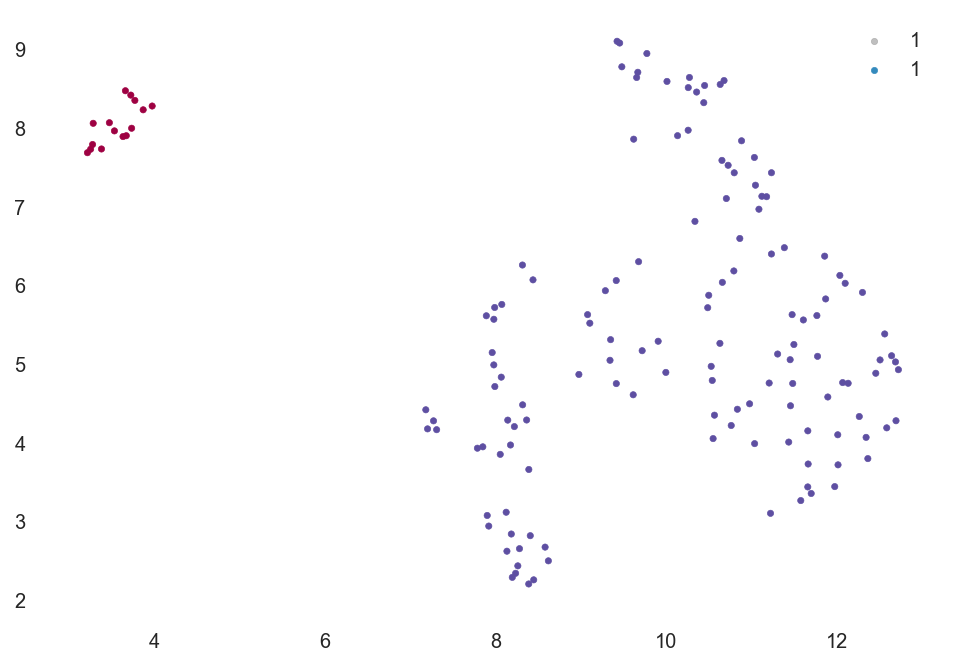

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


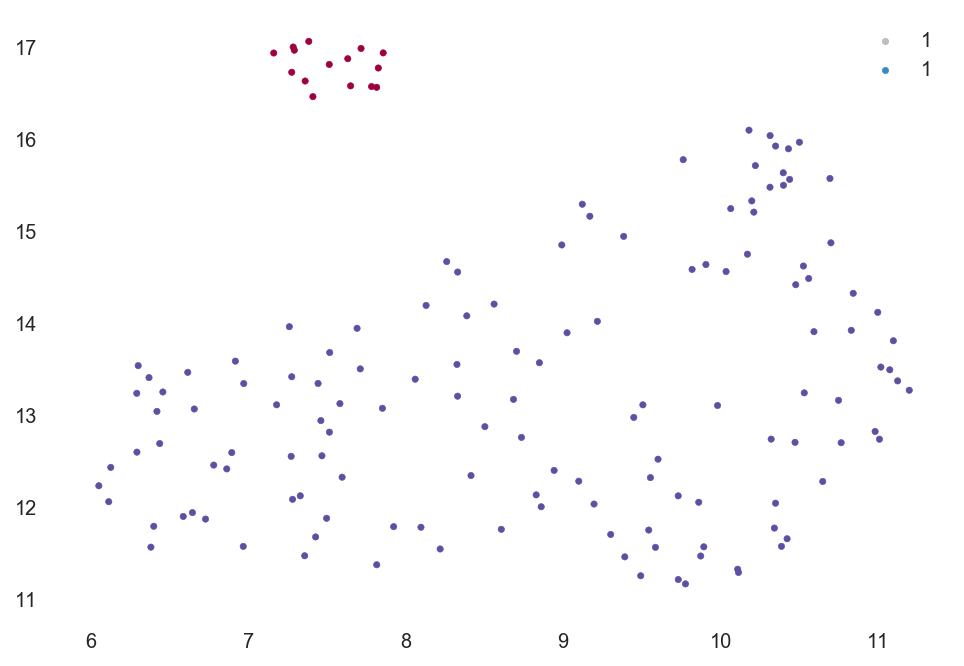

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


---------------
min_cluster size: 10
found 2 clusters
fraction clustered: 1.0


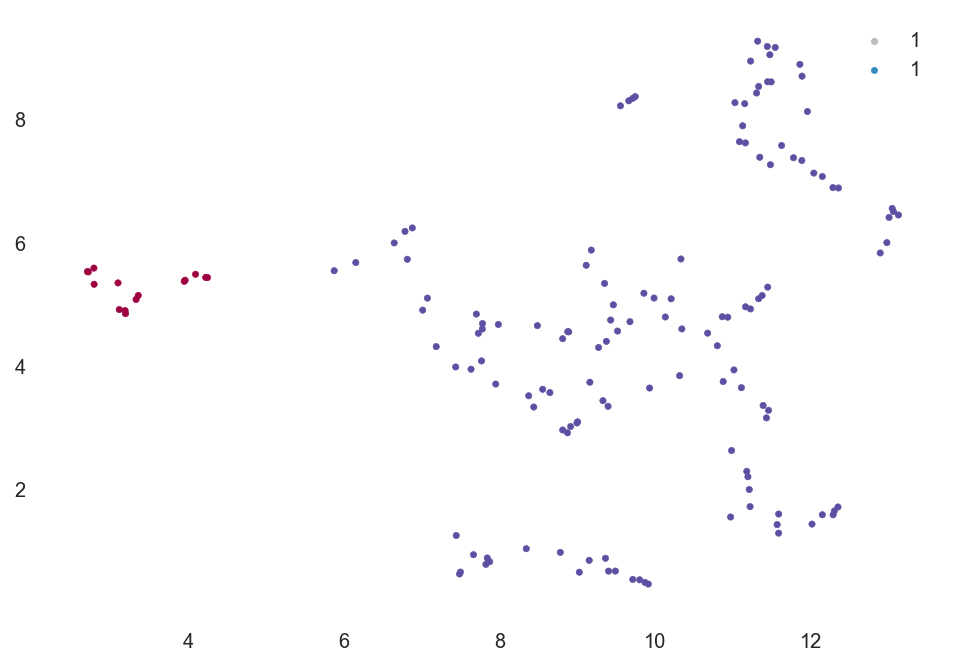

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


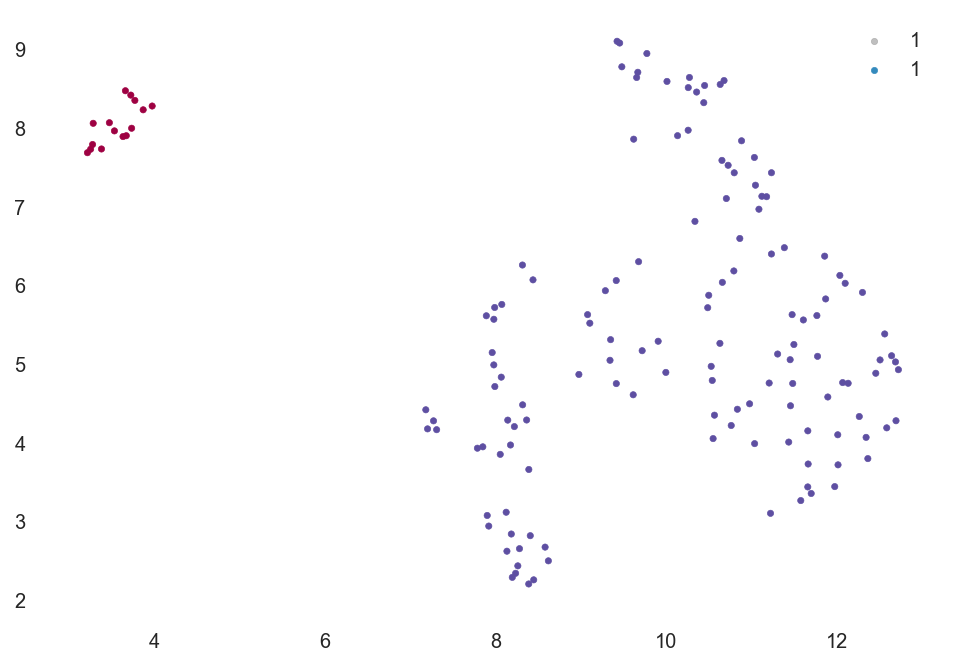

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


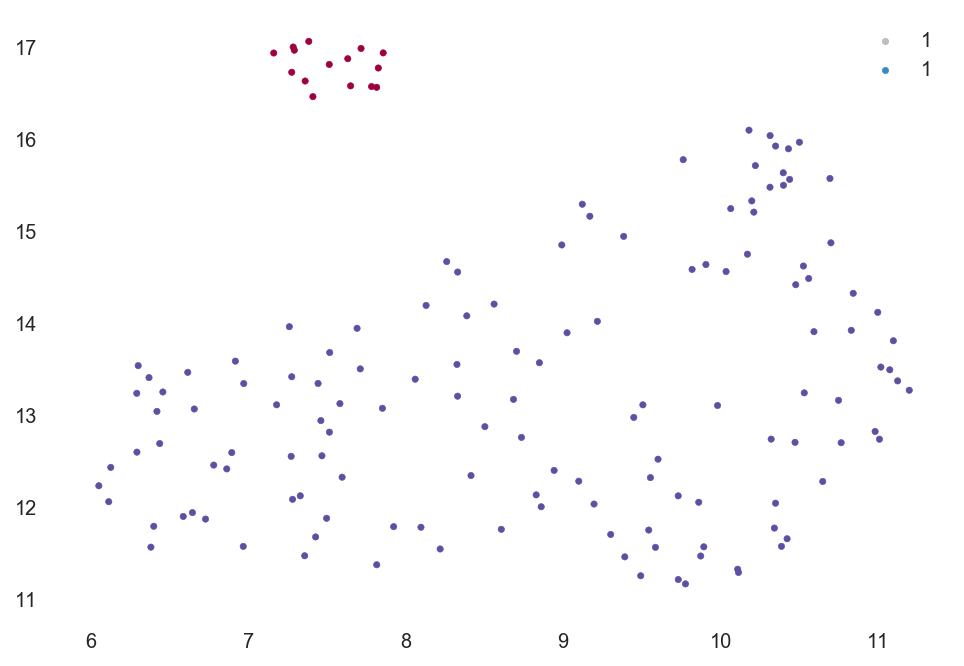

---------------


In [41]:

for min_cluster_size in [2,5,10]:
    utils.cluster_hdbscan(viz_embedding_10, min_cluster_size, [viz_embedding_5, viz_embedding_10, viz_embedding_20 ])
    print("---------------")

#### Final clustering

min_cluster size: 5
found 5 clusters
fraction clustered: 0.9932885906040269


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


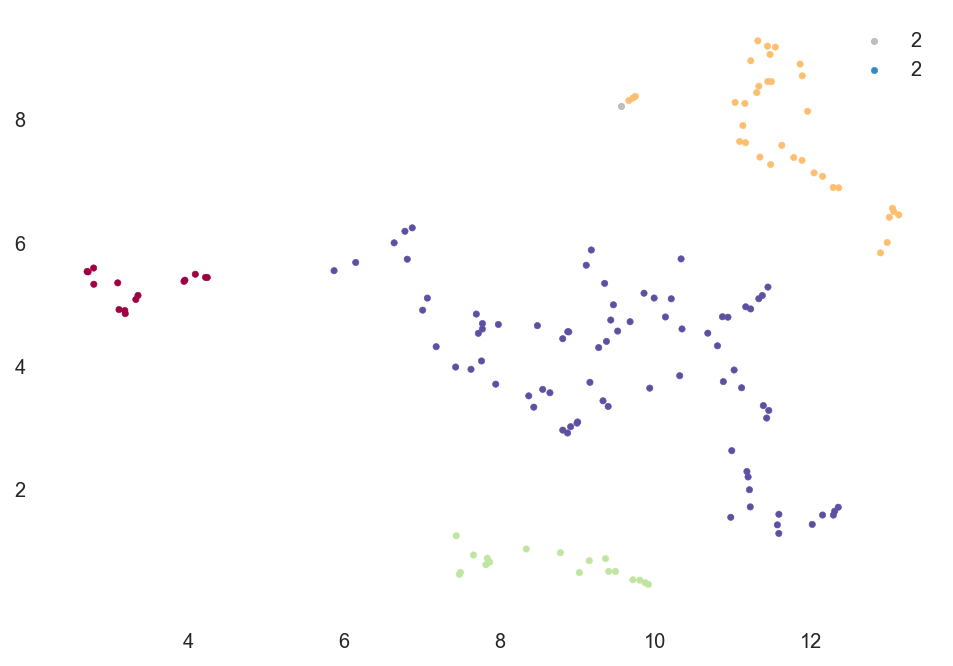

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


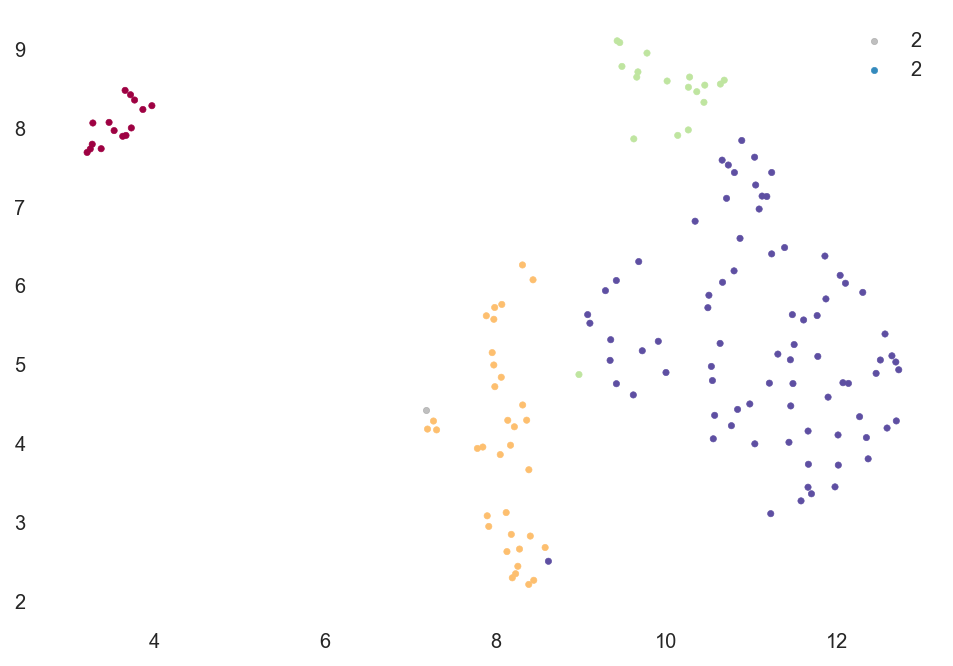

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


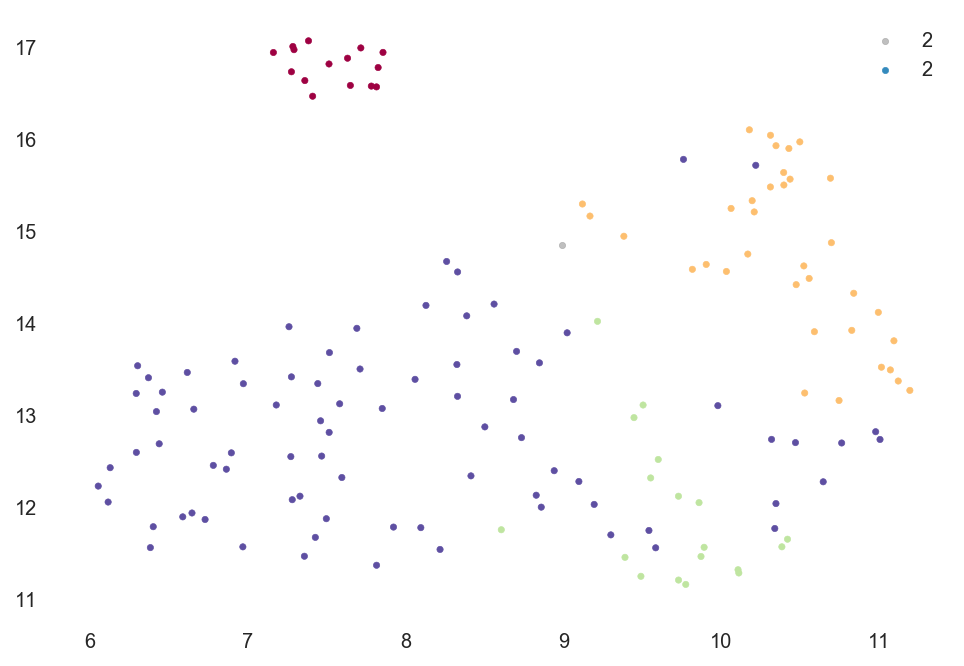

In [42]:
labels = utils.cluster_hdbscan(viz_embedding_5, 5, [viz_embedding_5, viz_embedding_10, viz_embedding_20 ])

---

### Find clusters' characteristics

In [43]:
clustering_X = umap_df.drop(columns="Budget_Start").loc[labels[labels!= -1],:]
clustering_X["label"] = labels[labels!= -1]

In [52]:
from IPython.utils import io


Extra params: {'scale_pos_weight': 8.866666666666667, 'show_output': False}


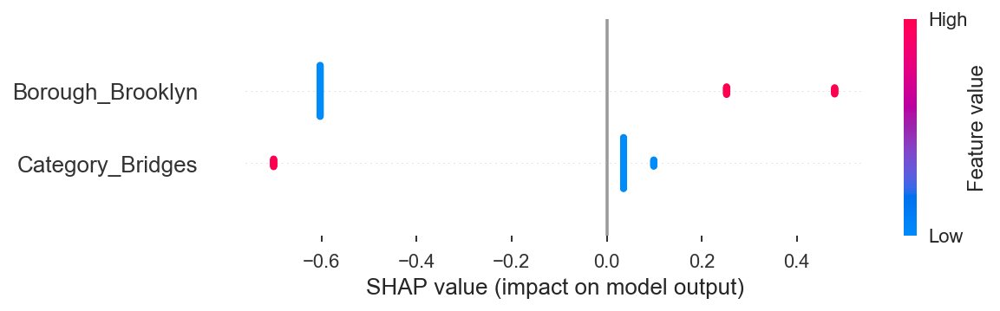

Extra params: {'scale_pos_weight': 3.2285714285714286, 'show_output': False}


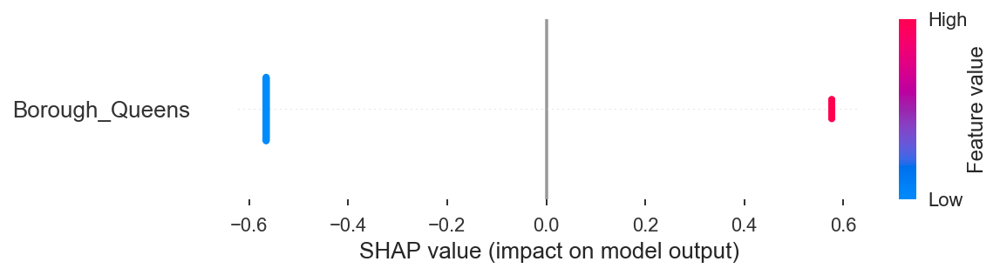

Extra params: {'scale_pos_weight': 7.222222222222222, 'show_output': False}


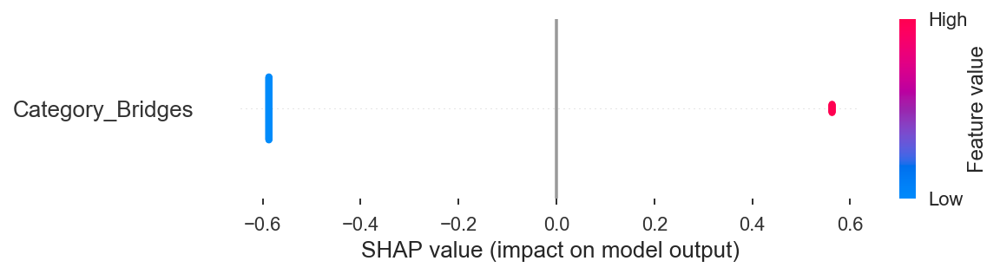

Extra params: {'scale_pos_weight': 0.85, 'show_output': False}


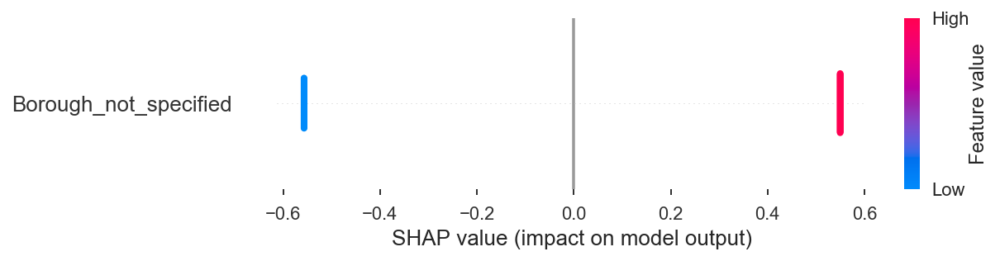

In [53]:
#long output and will crash your notebook

min_size5_dict = get_cluster_defining_features(umap_df.drop(columns="Budget_Start").loc[labels[labels!= -1],:], labels[labels!= -1], "min_cluster_size5") 

In [58]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(clustering_X.groupby("label").mean().var().sort_values(ascending=False))

Current_Project_Year                           0.416667
Number_Changes                                 0.416667
Duration_Start                                 0.345011
Managing_Agency_DEP                            0.333333
Borough_Brooklyn                               0.333333
Client_Agency_not_specified                    0.333333
Category_Wastewater Treatment                  0.333333
Client_Agency_DEP                              0.333333
Managing_Agency_DOT                            0.333333
Borough_not_specified                          0.250000
Category_Bridges                               0.250000
Borough_Queens                                 0.250000
Category_Ferries                               0.250000
Phase_End_3-Construction Procurement           0.250000
Phase_End_4-Construction                       0.250000
Current_Project_Years                          0.229907
Category_Industrial Development                0.000000
Category_Bridges, Streets and Roadways         0

In [59]:
min_size5_dict.keys()

dict_keys([0, 1, 2, 3, 'combined_cluster_info_mean_peaks_per_cluster', 'cluster_setting'])

In [60]:
min_size5_dict['combined_cluster_info_mean_peaks_per_cluster']

,num_model_used_this_peak,cases_in_cluster_mean,cases_not_in_cluster_mean,cases_in_cluster_median,cases_not_in_cluster_median,cluster
Borough_Brooklyn,1000,1.0,0.135338,1,0,0
Category_Bridges,1000,0.0,0.135338,0,0,0
Borough_Queens,1000,1.0,0.000000,1,0,1
Category_Bridges,1000,1.0,0.000000,1,0,2
Borough_not_specified,1000,1.0,0.000000,1,0,3


In [63]:
min_size5_dict[0].keys()

dict_keys(['AUC_fig', 'shap_summary_plot', 'cluster_info_mean_peaks_per_cluster'])

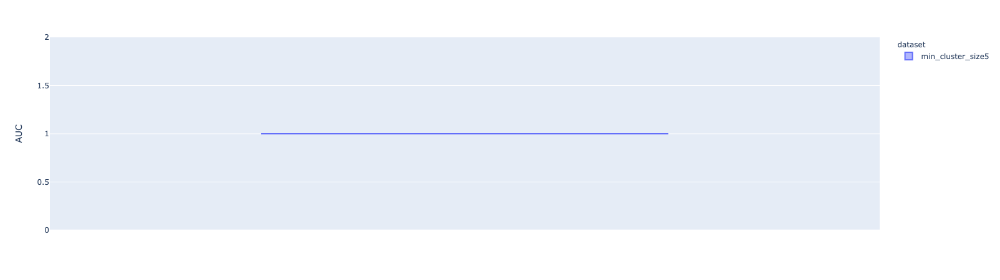

In [64]:
min_size5_dict[0]["AUC_fig"]

In [68]:
cluster_features = list(clustering_X.groupby("label").mean().var()[clustering_X.groupby("label").mean().var() != 0].index)
cluster_features

['Borough_Brooklyn',
 'Borough_Queens',
 'Borough_not_specified',
 'Category_Bridges',
 'Category_Ferries',
 'Category_Wastewater Treatment',
 'Client_Agency_DEP',
 'Client_Agency_not_specified',
 'Current_Project_Year',
 'Current_Project_Years',
 'Duration_Start',
 'Managing_Agency_DEP',
 'Managing_Agency_DOT',
 'Number_Changes',
 'Phase_End_3-Construction Procurement',
 'Phase_End_4-Construction']

In [76]:
radar_plots_df = clustering_X[cluster_features + ["label"]].groupby("label").mean().reset_index().rename(columns={"label":"group"})
radar_plots_df

,group,Borough_Brooklyn,Borough_Queens,Borough_not_specified,Category_Bridges,Category_Ferries,Category_Wastewater Treatment,Client_Agency_DEP,Client_Agency_not_specified,Current_Project_Year,Current_Project_Years,Duration_Start,Managing_Agency_DEP,Managing_Agency_DOT,Number_Changes,Phase_End_3-Construction Procurement,Phase_End_4-Construction
0,0,1,0,0,0,0,1,1,0,1.0,1.162821,0.553785,1,0,0.0,0,1
1,1,0,1,0,0,0,1,1,0,1.5,1.348718,-0.120850,1,0,0.5,0,1
2,2,1,0,0,1,0,0,0,1,2.0,1.864103,1.293493,0,1,-0.5,1,0
3,3,0,0,1,0,1,0,0,1,0.5,0.705128,0.788845,0,1,1.0,0,1


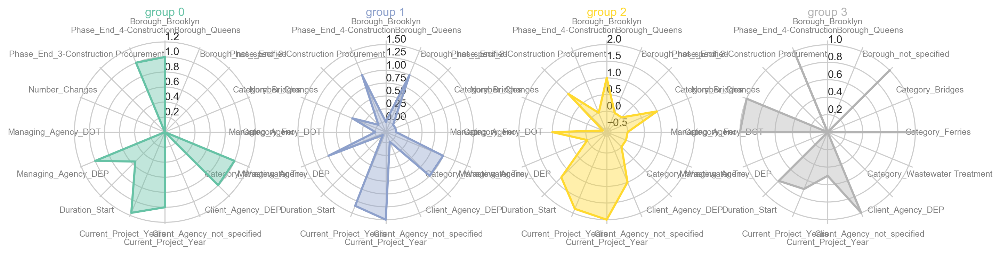

In [116]:
from math import pi
def make_spider(mean_peaks_per_cluster, row, title, color):
    # number of variable
    categories=list(mean_peaks_per_cluster)[1:]
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(4,4,row+1, polar=True, )

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey', size=8)

    # Draw ylabels
    ax.set_rlabel_position(0)
    #plt.yticks([10,20,30], ["10","20","30"], color="grey", size=7)
    #plt.ylim(0,40)

    # Ind1
    scaled = mean_peaks_per_cluster.loc[row].drop('group').values
    values=mean_peaks_per_cluster.loc[row].drop('group').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    # Add a title
    plt.title(title, size=11, color=color, y=1.1)

    
# ------- PART 2: Apply to all individuals
# initialize the figure
my_dpi=70
plt.figure(figsize=(1000/my_dpi, 1000/my_dpi + 50), dpi=my_dpi + 40)

# Create a color palette:
my_palette = plt.cm.get_cmap("Set2", len(radar_plots_df.index))

# Loop to plot
for row in range(0, len(radar_plots_df.index)):
    make_spider( radar_plots_df, row=row, title='group '+radar_plots_df['group'][row].astype("str"), color=my_palette(row))

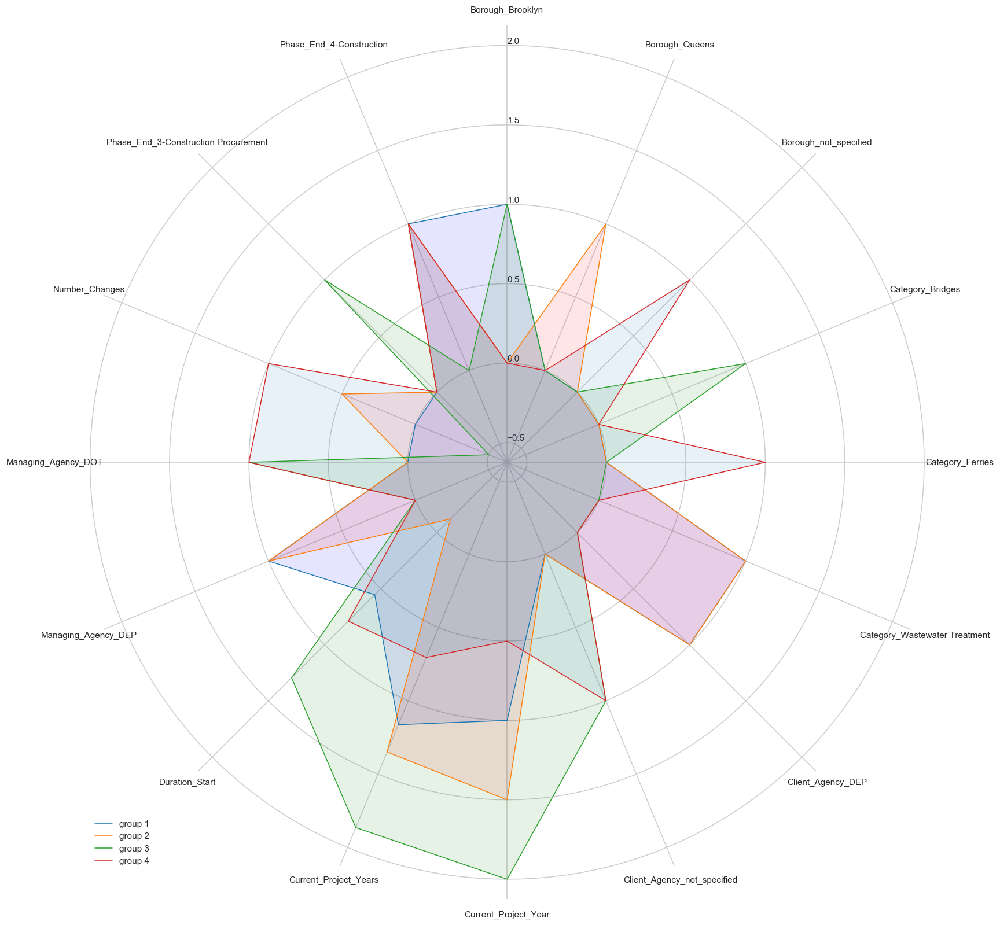

In [106]:
# ------- PART 1: Create background
 
# number of variable
categories=list(radar_plots_df)[1:]
N = len(categories)
 
# What will be the angle of each axis in the plot? (we divide the plot / number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

plt.figure(figsize=(1000/my_dpi, 1000/my_dpi), dpi=my_dpi)
# Initialise the spider plot
ax = plt.subplot(111, polar=True)
 
# If you want the first axis to be on top:
ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)
 
# Draw one axe per variable + add labels labels yet
plt.xticks(angles[:-1], categories)
 
# Draw ylabels
ax.set_rlabel_position(0)
#plt.yticks([10,20,30], ["10","20","30"], color="grey", size=7)
#plt.ylim(0,40)
 
 
# ------- PART 2: Add plots
 
# Plot each individual = each line of the data
# I don't do a loop, because plotting more than 3 groups makes the chart unreadable

# Ind1
values=radar_plots_df.loc[0].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="group 1")
ax.fill(angles, values, 'b', alpha=0.1)
 
# Ind2
values=radar_plots_df.loc[1].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="group 2")
ax.fill(angles, values, 'r', alpha=0.1)

# Ind3
values=radar_plots_df.loc[2].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="group 3")
ax.fill(angles, values, 'g', alpha=0.1)

# Ind3
values=radar_plots_df.loc[3].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="group 4")
ax.fill(angles, values, 'o', alpha=0.1)
 
# Add legend
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))


#### TL,DR

*NOTE: In the TL,DR, optimize for **clarity** and **comprehensiveness**. The goal is to convey the post with the least amount of friction, especially since ipython/beakers require much more scrolling than blog posts. Make the reader get a correct understanding of the post's takeaway, and the points supporting that takeaway without having to strain through paragraphs and tons of prose. Bullet points are great here, but are up to you. Try to avoid academic paper style abstracts.*

 - Having a specific title will help avoid having someone browse posts and only finding vague, similar sounding titles
 - Having an itemized, short, and clear tl,dr will help readers understand your content
 - Setting the reader's context with a motivation section makes someone understand how to judge your choices
 - Visualizations that can stand alone, via legends, labels, and captions are more understandable and powerful


### Motivation

*NOTE: optimize in this section for **context setting**, as specifically as you can. For instance, this post is generally a set of standards for work in the repo. The specific motivation is to have least friction to current workflow while being able to painlessly aggregate it later.*

The knowledge repo was created to consolidate research work that is currently scattered in emails, blogposts, and presentations, so that people didn't redo their work.

### This Section Says Exactly This Takeaway

Text(0, 0.5, 'both of them')

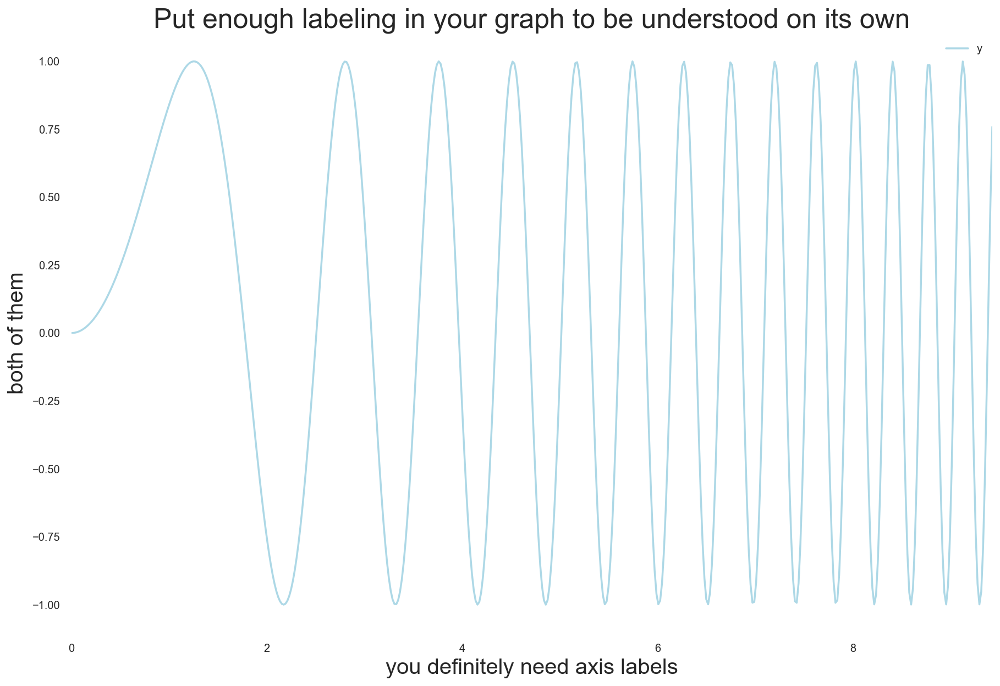

In [47]:

%matplotlib inline

x = np.linspace(0, 3*np.pi, 500)
plot_df = pd.DataFrame()
plot_df["x"] = x
plot_df["y"] = np.sin(x**2)


plot_df.plot('x', 'y', 
             color='lightblue',
             figsize=(15,10))
plt.title("Put enough labeling in your graph to be understood on its own", size=25)
plt.xlabel('you definitely need axis labels', size=20)
plt.ylabel('both of them', size=20)

---

### Point 1

#### TL,DR

*NOTE: In the TL,DR, optimize for **clarity** and **comprehensiveness**. The goal is to convey the post with the least amount of friction, especially since ipython/beakers require much more scrolling than blog posts. Make the reader get a correct understanding of the post's takeaway, and the points supporting that takeaway without having to strain through paragraphs and tons of prose. Bullet points are great here, but are up to you. Try to avoid academic paper style abstracts.*

 - Having a specific title will help avoid having someone browse posts and only finding vague, similar sounding titles
 - Having an itemized, short, and clear tl,dr will help readers understand your content
 - Setting the reader's context with a motivation section makes someone understand how to judge your choices
 - Visualizations that can stand alone, via legends, labels, and captions are more understandable and powerful


### Motivation

*NOTE: optimize in this section for **context setting**, as specifically as you can. For instance, this post is generally a set of standards for work in the repo. The specific motivation is to have least friction to current workflow while being able to painlessly aggregate it later.*

The knowledge repo was created to consolidate research work that is currently scattered in emails, blogposts, and presentations, so that people didn't redo their work.

### This Section Says Exactly This Takeaway

Text(0, 0.5, 'both of them')

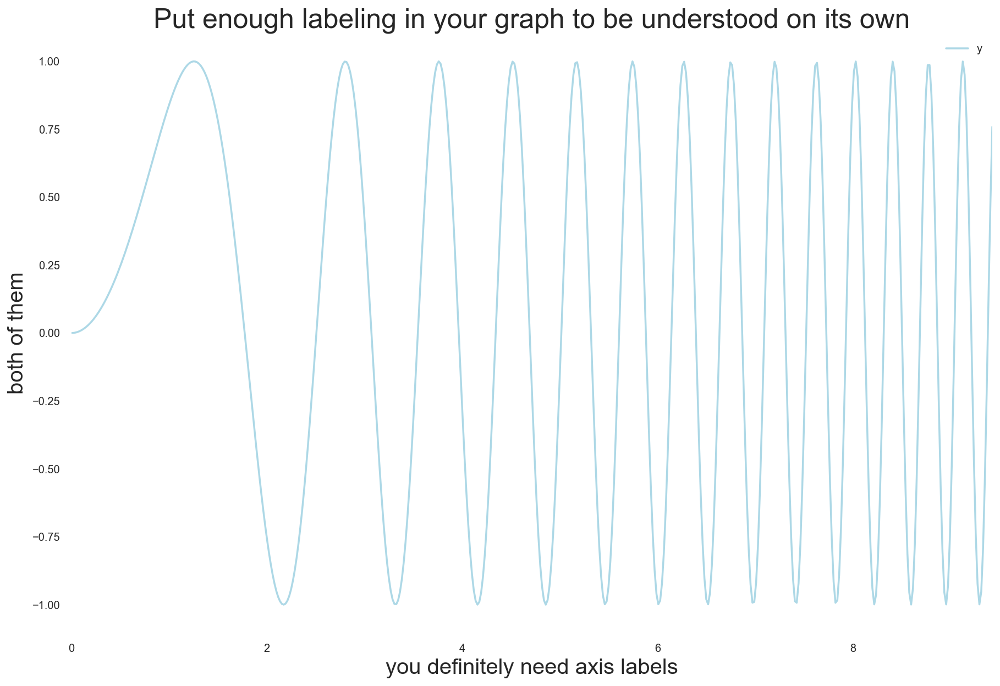

In [48]:

%matplotlib inline

x = np.linspace(0, 3*np.pi, 500)
plot_df = pd.DataFrame()
plot_df["x"] = x
plot_df["y"] = np.sin(x**2)


plot_df.plot('x', 'y', 
             color='lightblue',
             figsize=(15,10))
plt.title("Put enough labeling in your graph to be understood on its own", size=25)
plt.xlabel('you definitely need axis labels', size=20)
plt.ylabel('both of them', size=20)

*NOTE: in graphs, optimize for being able to **stand alone**. When aggregating and putting things in presentations, you won't have to recreate and add code to each plot to make it understandable without the entire post around it. Will it be understandable without several paragraphs?*

### Putting Big Bold Headers with Clear Takeaways Will Help Us Aggregate Later

### Appendix

Put all the stuff here that is not necessary for supporting the points above. Good place for documentation without distraction.